# This part of this Notebook will be used for exploring, segmenting and clustering the neighbourhoods within the City of London, United Kingdom.

### The first step is to dowload all dependencies and libraries required to achieve the task

In [4]:
#Importing numpy to handle data in vectorised manner or format
import numpy as np

#Importing the pandas dataframe for data analysis
import pandas as pd
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

#Importing json to read json files
import json

#Installing geopy to enable the geocoding library which converts address to latitude and longitude
!conda install -c conda-forge geopy --yes

#Importing Nominatim to convert address into latitude and longitude
from geopy.geocoders import Nominatim

#Importing a library to handle requests
#import requests
#Importing the required Matplotlib libraries
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as colors
#Importing K-Means algorithm from sklearn for clustering
from sklearn.cluster import KMeans
#Installing folium library for map rendering
!conda install -c conda-forge folium=0.5.0 --yes
#Importing the installed folium library
print('Libraries installed!')

Solving environment: done

## Package Plan ##

  environment location: /opt/conda/envs/Python36

  added / updated specs: 
    - geopy


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    ca-certificates-2019.11.28 |       hecc5488_0         145 KB  conda-forge
    geographiclib-1.50         |             py_0          34 KB  conda-forge
    geopy-1.20.0               |             py_0          57 KB  conda-forge
    certifi-2019.11.28         |           py36_0         149 KB  conda-forge
    openssl-1.1.1d             |       h516909a_0         2.1 MB  conda-forge
    ------------------------------------------------------------
                                           Total:         2.5 MB

The following NEW packages will be INSTALLED:

    geographiclib:   1.50-py_0         conda-forge
    geopy:           1.20.0-py_0       conda-forge

The following packages will be UPDATED:

    ca-

In [5]:
#Importing the json_normalise function to transform json file into a pandas dataframe
from pandas.io.json import json_normalize
print('Json normalize imported')

Json normalize imported


In [6]:
#Importing a library to handle requests
import requests

# The Dataset
The dataset used in this project was obtained from www.insideairbnb.com . The raw dataset for listings (dated 14 September 2019) was selected because it contains all the necessary data that are required for this project. Any unnecessary data will be discarded during the data cleaning process. The most important data required for this project are Post Code, Borough, Neighbourhood, Latitude, Longitude was obtained from https://www.doogal.co.uk/UKPostcodesCSV.ashx?region=E12000007. Average property price data was extracted from https://data.london.gov.uk/download/average-house-prices/b1b0079e-698c-4c0b-b8c7-aa6189590ca4/land-registry-house-prices-borough.csv . London crime data was ectracted from https://data.london.gov.uk/download/recorded_crime_rates/c051c7ec-c3ad-4534-bbfe-6bdfee2ef6bb/crime%20rates.csv. Trending venues data for the top neighbourhoods were obtained from https://foursquare.com/developers/apps via the API. Note that a developer's account is required. This additional data was used for exploring, segmenting and clustering the neighbourhoods and the most trending venues within the top neighbourhoods. The London Neighbourhoods json file is also available and will be used within this project.

In [7]:
#Requesting the London neighbourhoods listings data from insideairbnb.com 
london_raw_data = pd.read_csv('http://data.insideairbnb.com/united-kingdom/england/london/2019-09-14/data/listings.csv.gz')

/opt/conda/envs/Python36/lib/python3.6/site-packages/IPython/core/interactiveshell.py:3020: DtypeWarning: Columns (61,62,94,95) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [8]:
#Converting the data into a pandas dataframe with all columns. This will be useful for column selection during data cleaning.
pd.set_option('display.max_columns', len(london_raw_data.columns))
pd.set_option('display.max_rows', 200)
df_london_raw = pd.DataFrame(london_raw_data)
df_london_raw.head(2)

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,notes,transit,access,interaction,house_rules,thumbnail_url,medium_url,picture_url,xl_picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,street,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,city,state,zipcode,market,smart_location,country_code,country,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,square_feet,price,weekly_price,monthly_price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,license,jurisdiction_names,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,11551,https://www.airbnb.com/rooms/11551,20190914144451,2019-09-15,Arty and Bright London Apartment in Zone 2,Unlike most rental apartments out there my fla...,"Amenities Bedding: 1 Double bed, 1 living room...",Unlike most rental apartments out there my fla...,family,Not even 10 minutes by metro from Victoria Sta...,No Smoking (very strict) Check-in time is afte...,Tons of buses (24hrs) go into central London f...,Guest will have access to the entire apartment,No interaction with guests as you book the ent...,No Smoking (very strict) No pets are allowed i...,NaN,NaN,https://a0.muscache.com/im/pictures/1d720898-c...,NaN,43039,https://www.airbnb.com/users/show/43039,Adriano,2009-10-03,"London, England, United Kingdom","Hello, I'm a friendly Italian man with a very ...",within an hour,100%,NaN,t,https://a0.muscache.com/im/pictures/user/2beb9...,https://a0.muscache.com/im/pictures/user/2beb9...,Brixton,3.0,3.0,"['email', 'phone', 'reviews', 'jumio', 'offlin...",t,t,"London, United Kingdom",Brixton,Lambeth,NaN,London,NaN,SW9 8DG,London,"London, United Kingdom",GB,United Kingdom,51.46225,-0.11732,t,Apartment,Entire home/apt,4,1.0,1.0,1.0,Real Bed,"{TV,""Cable TV"",Internet,Wifi,Kitchen,""Paid par...",NaN,$88.00,$645.00,"$2,350.00",$400.00,$30.00,2,$20.00,2,180,2,2,180,180,2.0,180.0,4 days ago,t,19,42,72,344,2019-09-15,184,1,2010-03-21,2019-07-10,92.0,9.0,9.0,10.0,10.0,9.0,9.0,f,NaN,NaN,t,f,strict_14_with_grace_period,f,t,2,2,0,0,1.59
1,13913,https://www.airbnb.com/rooms/13913,20190914144451,2019-09-15,Holiday London DB Room Let-on going,My bright double bedroom with a large window h...,"Hello Everyone, I'm offering my lovely double ...",My bright double bedroom with a large window h...,business,Finsbury Park is a friendly melting pot commun...,For art lovers I can give guest my Tate Member...,The flat only a 10 minute walk to Finsbury Par...,Guest will have access to the self catering ki...,I like to have little chats with my guest over...,I'm an artist and have my artwork up on the wa...,NaN,NaN,https://a0.muscache.com/im/pictures/ffb507b7-9...,NaN,54730,https://www.airbnb.com/users/show/54730,Alina,2009-11-16,"London, England, United Kingdom",I am a Multi-Media Visual Artist and Creative ...,within an hour,100%,NaN,f,https:/

In [9]:
df_london_raw.shape

(85273, 106)

# Cleaning and pre-processing the data
It can be seen above that the data is quite unworkable with and need to be cleaned such that all useless data is discarded. 

### The first step is to drop all unwanted columns such as id, listing_url, scrape_id etc.

In [10]:
#Grouping columns to keep into a dataframe
columns_kept = df_london_raw[['host_location','host_neighbourhood','neighbourhood','neighbourhood_cleansed', 'city','zipcode', 
                'smart_location', 'country_code', 'country','latitude','longitude','property_type','room_type',
                'price','weekly_price','monthly_price', 'review_scores_location']]
#Defining a dataframe with the columns_kept. This may be useful if the columns kept are required to change. 
df_london_1 = columns_kept
df_london_1.head()

,host_location,host_neighbourhood,neighbourhood,neighbourhood_cleansed,city,zipcode,smart_location,country_code,country,latitude,longitude,property_type,room_type,price,weekly_price,monthly_price,review_scores_location
0,"London, England, United Kingdom",Brixton,Brixton,Lambeth,London,SW9 8DG,"London, United Kingdom",GB,United Kingdom,51.46225,-0.11732,Apartment,Entire home/apt,$88.00,$645.00,"$2,350.00",9.0
1,"London, England, United Kingdom",LB of Islington,LB of Islington,Islington,Islington,N4 3,"Islington, United Kingdom",GB,United Kingdom,51.56802,-0.11121,Apartment,Private room,$65.00,$333.00,"$1,176.00",9.0
2,"Kensington, England, United Kingdom",Chelsea,Chelsea,Kensington and Chelsea,London,SW3,"London, United Kingdom",GB,United Kingdom,51.48796,-0.16898,Apartment,Entire home/apt,$100.00,$600.00,"$2,250.00",10.0
3,"London, England, United Kingdom",Fitzrovia,City of Westminster,Westminster,London,W1T4BP,"London, United Kingdom",GB,United Kingdom,51.52098,-0.14002,Apartment,Entire home/apt,$300.00,"$1,378.00",NaN,10.0
4,"London, England, United Kingdom",Battersea,LB of Wandsworth,Wandsworth,London,SW11 5GX,"London, United Kingdom",GB,United Kingdom,51.47298,-0.16376,Townhouse,Entire home/apt,$175.00,"$1,050.00","$3,500.00",9.0


Looking at the new dataframe shows that it is far much better now but still confusing and there are missing values replaced with NaN (Not a Number). There is a requirement for further cleaning. Some columns must be dropped but which ones? To answer that question, it is quite important at this point to have some understanding of how Post Codes, Postal Districts and Neighbourhoods in London actually work. For further information please visit https://en.wikipedia.org/wiki/London_postal_district. 

At this point the following columns will be dropped or renamed:

host_location: This row will be dropped because it is not serving any useful purpose.The location is well known that it is London.

host_neighbourhood: Column to kept but renamed to Neighbourhood. This gives the granualar level of neighbourhoods in London.

neighbourhood: This will be dropped. The data in this column is less accurate than the data in the host_neighbourhood column.

neighbourhood_cleansed: Column to be kept but renamed to Borough because it is the most appropriate column name.

country_code: Column to be dropped. The country has already been defined in the introduction section.

country : Column to be dropped. The country has already been defined in the introduction section.

latitude: Column to be kept. This column contains very useful data for this project.

longitude: Column to be kept. This column contains very useful data for this project.

property_type: This column will be kept as it describes the type of property. This data will be used for further analysis later.

room_type: Column to be kept. The data may be useful for granular analysis.

price: Column to be kept but the currency will be converted to GBP (£) or Pound Sterling.

weekly_price: Column to be kept but the currency will be converted to GBP (£) or Pound Sterling. Rename to Weekly Price.

monthly_price: Column to be kept but the currency will be converted to GBP (£) or Pound Sterling. Rename to Monthly Price.

review_scores_location: Column to be kept . The data may be useful for granular analysis. Rename to Location Review Score.








In [11]:
df_london_1.shape

(85273, 17)

In [12]:
# Checking the data types for each column 
df_london_1.dtypes

host_location              object
host_neighbourhood         object
neighbourhood              object
neighbourhood_cleansed     object
city                       object
zipcode                    object
smart_location             object
country_code               object
country                    object
latitude                  float64
longitude                 float64
property_type              object
room_type                  object
price                      object
weekly_price               object
monthly_price              object
review_scores_location    float64
dtype: object

In [13]:
#Dropping unwanted columns
df_london_1.drop(['host_location','neighbourhood','country_code','country','city','smart_location'], axis =1, inplace = True)
df_london_1.head()

/opt/conda/envs/Python36/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)


,host_neighbourhood,neighbourhood_cleansed,zipcode,latitude,longitude,property_type,room_type,price,weekly_price,monthly_price,review_scores_location
0,Brixton,Lambeth,SW9 8DG,51.46225,-0.11732,Apartment,Entire home/apt,$88.00,$645.00,"$2,350.00",9.0
1,LB of Islington,Islington,N4 3,51.56802,-0.11121,Apartment,Private room,$65.00,$333.00,"$1,176.00",9.0
2,Chelsea,Kensington and Chelsea,SW3,51.48796,-0.16898,Apartment,Entire home/apt,$100.00,$600.00,"$2,250.00",10.0
3,Fitzrovia,Westminster,W1T4BP,51.52098,-0.14002,Apartment,Entire home/apt,$300.00,"$1,378.00",NaN,10.0
4,Battersea,Wandsworth,SW11 5GX,51.47298,-0.16376,Townhouse,Entire home/apt,$175.00,"$1,050.00","$3,500.00",9.0


#Tidying up the column names and creating a new dataframe

df_london_2 = df_london_1[df_london_1.replace({'host_neighbourhood':'Neighbourhood','neighbourhood_cleansed':'Borough','zipcode':'Post Code',
                                  'latitude':'Latitude','longitude':'Longitude','property_type':'Property Type', 'room_type':'Room Type',
                                  'price':'Price(£)','weekly_price':'Weekly Price(£)','monthly_price':'Monthly Price (£)',
                                   'review_scores_location':'Location Review Scores (max 10)' }, inplace = True)]
df_london_2.head()

In [14]:
df_london_1.columns = ('Neighbourhood','Borough','Post_Code','Latitude','Longitude','Property_Type','Room_Type','Price','Weekly_Price',
                       'Monthly_Price','Location_Review_Scores')
df_london_1.head()

,Neighbourhood,Borough,Post_Code,Latitude,Longitude,Property_Type,Room_Type,Price,Weekly_Price,Monthly_Price,Location_Review_Scores
0,Brixton,Lambeth,SW9 8DG,51.46225,-0.11732,Apartment,Entire home/apt,$88.00,$645.00,"$2,350.00",9.0
1,LB of Islington,Islington,N4 3,51.56802,-0.11121,Apartment,Private room,$65.00,$333.00,"$1,176.00",9.0
2,Chelsea,Kensington and Chelsea,SW3,51.48796,-0.16898,Apartment,Entire home/apt,$100.00,$600.00,"$2,250.00",10.0
3,Fitzrovia,Westminster,W1T4BP,51.52098,-0.14002,Apartment,Entire home/apt,$300.00,"$1,378.00",NaN,10.0
4,Battersea,Wandsworth,SW11 5GX,51.47298,-0.16376,Townhouse,Entire home/apt,$175.00,"$1,050.00","$3,500.00",9.0


In [15]:
#Checking the size of the dataframe
df_london_1.shape

(85273, 11)

It can be seen that the dataframe has more than 85000 rows and with 11 columns

#### The next step is to deal with missing data

This will be done column by column. 

It is best to delete every row which has NaN value(s) in any of the columns Neighbourhood, Borough, Post Code, Latitude, Longitude.

In [16]:
# delete every row which has NaN value(s) in any of the columns Neighbourhood, Borough, Post Code, Latitude, Longitude
df_london_2 = df_london_1.dropna(how='any', subset= ['Neighbourhood', 'Borough', 'Post_Code', 'Latitude', 'Longitude'])
df_london_2.head()

,Neighbourhood,Borough,Post_Code,Latitude,Longitude,Property_Type,Room_Type,Price,Weekly_Price,Monthly_Price,Location_Review_Scores
0,Brixton,Lambeth,SW9 8DG,51.46225,-0.11732,Apartment,Entire home/apt,$88.00,$645.00,"$2,350.00",9.0
1,LB of Islington,Islington,N4 3,51.56802,-0.11121,Apartment,Private room,$65.00,$333.00,"$1,176.00",9.0
2,Chelsea,Kensington and Chelsea,SW3,51.48796,-0.16898,Apartment,Entire home/apt,$100.00,$600.00,"$2,250.00",10.0
3,Fitzrovia,Westminster,W1T4BP,51.52098,-0.14002,Apartment,Entire home/apt,$300.00,"$1,378.00",NaN,10.0
4,Battersea,Wandsworth,SW11 5GX,51.47298,-0.16376,Townhouse,Entire home/apt,$175.00,"$1,050.00","$3,500.00",9.0


#Dropping the index column
df_london_2.drop('index',axis=1, inplace = True)
df_london_2.head()

In [17]:
#Forming a new dataframe to facilitate pre-processing of the price columns
df_london_3 = df_london_2
df_london_3.head()

,Neighbourhood,Borough,Post_Code,Latitude,Longitude,Property_Type,Room_Type,Price,Weekly_Price,Monthly_Price,Location_Review_Scores
0,Brixton,Lambeth,SW9 8DG,51.46225,-0.11732,Apartment,Entire home/apt,$88.00,$645.00,"$2,350.00",9.0
1,LB of Islington,Islington,N4 3,51.56802,-0.11121,Apartment,Private room,$65.00,$333.00,"$1,176.00",9.0
2,Chelsea,Kensington and Chelsea,SW3,51.48796,-0.16898,Apartment,Entire home/apt,$100.00,$600.00,"$2,250.00",10.0
3,Fitzrovia,Westminster,W1T4BP,51.52098,-0.14002,Apartment,Entire home/apt,$300.00,"$1,378.00",NaN,10.0
4,Battersea,Wandsworth,SW11 5GX,51.47298,-0.16376,Townhouse,Entire home/apt,$175.00,"$1,050.00","$3,500.00",9.0


In [18]:
#Checking the new shape of the dataframe
df_london_3.shape

(65608, 11)

The new dataframe has 65608 rows and 11 columns and the most important columns Neighbourhood, Borough, Post Code, Latitude, Longitude have values.

#### The next step is to deal with missing data for weekly and monthly price columns.

The following assumptions have been made.

1. If both nightly and weekly prices are available but the monthly price value is missing, then (monthly price = (3.5 x weekly price)).  The factor of 3.5 has been derived from calculations from rows where all nightly, weekly and monthly prices are available.

2. If both nightly and weekly prices are missing, then it can be assumed that the property owner does not offer any discounts for block booking. Then assuming a property occupancy rate of 70% obtained from https://www.visitbritain.org/accommodation-occupancy-latest-results;
    a.   weekly price = price x (0.7 x 7 days) 
    b.   monthly price = weekly price x (0.7 x 28 days)
    
3. A month is 28 days long.

In [19]:
#Trial to change object datatype for price columns to float
df_data = df_london_3
df_data.columns = ('Neighbourhood','Borough','PostCode','Latitude','Longitude','Property_Type','Room_Type','Price','Weekly_Price',
                       'Monthly_Price','Location_Review_Scores')
#df_data['Price(£)'] = df_data['Price(£)'].astype(str)
df_data.Price = df_data.Price.str[1:-3]
df_data.Price = df_data.Price.str.replace(",", "")
df_data.Price= df_data.Price.astype(float)

df_data.Weekly_Price = df_data.Weekly_Price.str[1:-3]
df_data.Weekly_Price = df_data.Weekly_Price.str.replace(",", "")
df_data.Weekly_Price= df_data.Weekly_Price.astype(float)

df_data.Monthly_Price = df_data.Monthly_Price.str[1:-3]
df_data.Monthly_Price = df_data.Monthly_Price.str.replace(",", "")
df_data.Monthly_Price= df_data.Monthly_Price.astype(float)
df_data.head()

/opt/conda/envs/Python36/lib/python3.6/site-packages/pandas/core/generic.py:5096: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[name] = value


,Neighbourhood,Borough,PostCode,Latitude,Longitude,Property_Type,Room_Type,Price,Weekly_Price,Monthly_Price,Location_Review_Scores
0,Brixton,Lambeth,SW9 8DG,51.46225,-0.11732,Apartment,Entire home/apt,88.0,645.0,2350.0,9.0
1,LB of Islington,Islington,N4 3,51.56802,-0.11121,Apartment,Private room,65.0,333.0,1176.0,9.0
2,Chelsea,Kensington and Chelsea,SW3,51.48796,-0.16898,Apartment,Entire home/apt,100.0,600.0,2250.0,10.0
3,Fitzrovia,Westminster,W1T4BP,51.52098,-0.14002,Apartment,Entire home/apt,300.0,1378.0,NaN,10.0
4,Battersea,Wandsworth,SW11 5GX,51.47298,-0.16376,Townhouse,Entire home/apt,175.0,1050.0,3500.0,9.0


In [20]:
df_data.dtypes

Neighbourhood              object
Borough                    object
PostCode                   object
Latitude                  float64
Longitude                 float64
Property_Type              object
Room_Type                  object
Price                     float64
Weekly_Price              float64
Monthly_Price             float64
Location_Review_Scores    float64
dtype: object

In [21]:
# delete every row which has NaN value(s) in any of the nightly price column.
df_data = df_data.dropna(how='any',subset=['Price'])
df_data.head()

,Neighbourhood,Borough,PostCode,Latitude,Longitude,Property_Type,Room_Type,Price,Weekly_Price,Monthly_Price,Location_Review_Scores
0,Brixton,Lambeth,SW9 8DG,51.46225,-0.11732,Apartment,Entire home/apt,88.0,645.0,2350.0,9.0
1,LB of Islington,Islington,N4 3,51.56802,-0.11121,Apartment,Private room,65.0,333.0,1176.0,9.0
2,Chelsea,Kensington and Chelsea,SW3,51.48796,-0.16898,Apartment,Entire home/apt,100.0,600.0,2250.0,10.0
3,Fitzrovia,Westminster,W1T4BP,51.52098,-0.14002,Apartment,Entire home/apt,300.0,1378.0,NaN,10.0
4,Battersea,Wandsworth,SW11 5GX,51.47298,-0.16376,Townhouse,Entire home/apt,175.0,1050.0,3500.0,9.0


In [22]:
#Checking the dataframe shape
df_data.shape

(65608, 11)

This confirms that all rows in the dataframe have at least a nightly price. Now it's time to replace missing data.

In [23]:
#Creating a new data frame df_london_4
df_london_4 = df_data
df_london_4.head()

,Neighbourhood,Borough,PostCode,Latitude,Longitude,Property_Type,Room_Type,Price,Weekly_Price,Monthly_Price,Location_Review_Scores
0,Brixton,Lambeth,SW9 8DG,51.46225,-0.11732,Apartment,Entire home/apt,88.0,645.0,2350.0,9.0
1,LB of Islington,Islington,N4 3,51.56802,-0.11121,Apartment,Private room,65.0,333.0,1176.0,9.0
2,Chelsea,Kensington and Chelsea,SW3,51.48796,-0.16898,Apartment,Entire home/apt,100.0,600.0,2250.0,10.0
3,Fitzrovia,Westminster,W1T4BP,51.52098,-0.14002,Apartment,Entire home/apt,300.0,1378.0,NaN,10.0
4,Battersea,Wandsworth,SW11 5GX,51.47298,-0.16376,Townhouse,Entire home/apt,175.0,1050.0,3500.0,9.0


Now there is need to replace NaN values with float zero before replacing the 

In [24]:
#Replacing NaN values with float zeros for weekly and monthly price columns
df_london_4['Weekly_Price'].fillna(0, inplace = True)
df_london_4['Monthly_Price'].fillna(0, inplace = True)
df_london_4.head()

,Neighbourhood,Borough,PostCode,Latitude,Longitude,Property_Type,Room_Type,Price,Weekly_Price,Monthly_Price,Location_Review_Scores
0,Brixton,Lambeth,SW9 8DG,51.46225,-0.11732,Apartment,Entire home/apt,88.0,645.0,2350.0,9.0
1,LB of Islington,Islington,N4 3,51.56802,-0.11121,Apartment,Private room,65.0,333.0,1176.0,9.0
2,Chelsea,Kensington and Chelsea,SW3,51.48796,-0.16898,Apartment,Entire home/apt,100.0,600.0,2250.0,10.0
3,Fitzrovia,Westminster,W1T4BP,51.52098,-0.14002,Apartment,Entire home/apt,300.0,1378.0,0.0,10.0
4,Battersea,Wandsworth,SW11 5GX,51.47298,-0.16376,Townhouse,Entire home/apt,175.0,1050.0,3500.0,9.0


In [25]:
df_london_4.dtypes

Neighbourhood              object
Borough                    object
PostCode                   object
Latitude                  float64
Longitude                 float64
Property_Type              object
Room_Type                  object
Price                     float64
Weekly_Price              float64
Monthly_Price             float64
Location_Review_Scores    float64
dtype: object

## The next step is to address the following questions

1. Which neighbourhoods and boroughs have which quantities of listings on AirBnB?
2. What property types are most common, (i.e House, apartment, hotel, etc)
3. Which areas are fetching the highest nightly price? What is the median price distribution for each neighbourhood? 

It is best to visualize the property listings on a london map with its respective boroughs as boundaries. This will be achieved by importing a geojson file, dated 14 September 2019 from Insideairbnb.com

# Importing the London Boroughs and postcodes data


In [26]:
#Installaing and importing folium, the map rendering library
import folium
print ('Folium imported!')

Folium imported!


In [28]:
# Importing Official London Post Code data
import pandas as pd
london_postcode = pd.read_csv('https://www.doogal.co.uk/UKPostcodesCSV.ashx?region=E12000007')
df_london_postcode = pd.DataFrame(london_postcode)
df_london_postcode.head()

,Postcode,In Use?,Latitude,Longitude,Easting,Northing,Grid Ref,County,District,Ward,District Code,Ward Code,Country,County Code,Constituency,Introduced,Terminated,Parish,National Park,Population,Households,Built up area,Built up sub-division,Lower layer super output area,Rural/urban,Region,Altitude,London zone,LSOA Code,Local authority,MSOA Code,Middle layer super output area,Parish Code,Census output area,Constituency Code,Index of Multiple Deprivation,Quality,User Type,Last updated,Nearest station,Distance to station,Postcode area,Postcode district,Police force,Water company,Plus Code
0,BR1 1AA,Yes,51.401546,0.015415,540291,168873,TQ402688,Greater London,Bromley,Bromley Town,E09000006,E05000109,England,E11000009,Bromley and Chislehurst,2016-05-01,NaN,"Bromley, unparished area",NaN,NaN,NaN,Greater London,Bromley,Bromley 018B,Urban major conurbation,London,71,5,E01000675,NaN,E02000144,Bromley 018,E43000196,E00003264,E14000604,20532,1,0,2019-11-23,Bromley South,0.218257,BR,BR1,Metropolitan Police,Thames Water,9F32C228+J5
1,BR1 1AB,Yes,51.406333,0.015208,540262,169405,TQ402694,Greater London,Bromley,Bromley Town,E09000006,E05000109,England,E11000009,Bromley and Chislehurst,2012-03-01,NaN,"Bromley, unparished area",NaN,NaN,NaN,Greater London,Bromley,Bromley 008B,Urban major conurbation,London,71,4,E01000676,NaN,E02000134,Bromley 008,E43000196,E00003255,E14000604,10169,1,0,2019-11-23,Bromley North,0.253666,BR,BR1,Metropolitan Police,Thames Water,9F32C248+G3
2,BR1 1AD,No,51.400057,0.016715,540386,168710,TQ403687,Greater London,Bromley,Bromley Town,E09000006,E05000109,England,E11000009,Bromley and Chislehurst,2014-09-01,2017-09-01,"Bromley, unparished area",NaN,NaN,NaN,Greater London,Bromley,Bromley 018B,Urban major conurbation,London,53,5,E01000675,NaN,E02000144,Bromley 018,E43000196,E00003264,E14000604,20532,1,1,2019-11-23,Bromley South,0.044559,BR,BR1,Metropolitan Police,NaN,9F32C228+2M
3,BR1 1AE,Yes,51.404543,0.014195,540197,169204,TQ401692,Greater London,Bromley,Bromley Town,E09000006,E05000109,England,E11000009,Bromley and Chislehurst,2008-08-01,NaN,"Bromley, unparished area",NaN,34.0,21.0,Greater London,Bromley,Bromley 018C,Urban major conurbation,London,71,4,E01000677,NaN,E02000144,Bromley 018,E43000196,E00003266,E14000604,19350,1,0,2019-11-23,Bromley North,0.462939,BR,BR1,Metropolitan Police,Thames Water,9F32C237+RM
4,BR1 1AF,Yes,51.401392,0.014948,540259,168855,TQ402688,Greater London,Bromley,Bromley Town,E09000006,E05000109,England,E11000009,Bromley and Chislehurst,2015-05-01,NaN,"Bromley, unparished area",NaN,NaN,NaN,Greater London,Bromley,Bromley 018B,Urban major conurbation,London,58,5,E01000675,NaN,E02000144,Bromley 018,E43000196,E00003264,E14000604,20532,1,0,2019-11-23,Bromley South,0.227664,BR,BR1,Metropolitan Police,Thames Water,9F32C227+HX


Cleaning the data and selecting only columns which are useful for this project. These columns are Postcode, Latitude, Longitude, District, Nearest station, Distance to station,Postcode district, London zone, Constituency

In [29]:
df_london_postcode1 = df_london_postcode[['Postcode', 'Ward','District','Postcode district','Latitude', 
                                          'Longitude','Nearest station', 'Distance to station', 'London zone']]
df_london_postcode1.head()

,Postcode,Ward,District,Postcode district,Latitude,Longitude,Nearest station,Distance to station,London zone
0,BR1 1AA,Bromley Town,Bromley,BR1,51.401546,0.015415,Bromley South,0.218257,5
1,BR1 1AB,Bromley Town,Bromley,BR1,51.406333,0.015208,Bromley North,0.253666,4
2,BR1 1AD,Bromley Town,Bromley,BR1,51.400057,0.016715,Bromley South,0.044559,5
3,BR1 1AE,Bromley Town,Bromley,BR1,51.404543,0.014195,Bromley North,0.462939,4
4,BR1 1AF,Bromley Town,Bromley,BR1,51.401392,0.014948,Bromley South,0.227664,5


This looks better but there is still need to rename some of the columns in accordance with https://en.wikipedia.org/wiki/List_of_London_boroughs and to match the df_london_4 dataframe with data sets from Airbnb listings data.

In [30]:
#Renaming columns
df_london_postcode1.columns = ('PostCode', 'Neighbourhood','Borough','Neighbourhood Postcode','Latitude', 'Longitude',
                               'Nearest Train Station', 'Distance to Station', 'London Zone')
df_london_postcode1.head()

,PostCode,Neighbourhood,Borough,Neighbourhood Postcode,Latitude,Longitude,Nearest Train Station,Distance to Station,London Zone
0,BR1 1AA,Bromley Town,Bromley,BR1,51.401546,0.015415,Bromley South,0.218257,5
1,BR1 1AB,Bromley Town,Bromley,BR1,51.406333,0.015208,Bromley North,0.253666,4
2,BR1 1AD,Bromley Town,Bromley,BR1,51.400057,0.016715,Bromley South,0.044559,5
3,BR1 1AE,Bromley Town,Bromley,BR1,51.404543,0.014195,Bromley North,0.462939,4
4,BR1 1AF,Bromley Town,Bromley,BR1,51.401392,0.014948,Bromley South,0.227664,5


In [31]:
#Merging the two dataframes ON the ['Post Code'] column which is common in both dataframes
df_merged_london = pd.merge(df_london_postcode1, df_london_4, on = ['PostCode','Borough'], how = 'inner')
#['PostCode','Neighbourhood','Borough','Latitude','Longitude']
df_merged_london.head()

,PostCode,Neighbourhood_x,Borough,Neighbourhood Postcode,Latitude_x,Longitude_x,Nearest Train Station,Distance to Station,London Zone,Neighbourhood_y,Latitude_y,Longitude_y,Property_Type,Room_Type,Price,Weekly_Price,Monthly_Price,Location_Review_Scores
0,BR1 1HW,Bromley Town,Bromley,BR1,51.400948,0.013574,Bromley South,0.282734,5,LB of Bromley,51.40083,0.01503,Apartment,Entire home/apt,69.0,0.0,0.0,10.0
1,BR1 1HW,Bromley Town,Bromley,BR1,51.400948,0.013574,Bromley South,0.282734,5,LB of Bromley,51.40098,0.01492,House,Entire home/apt,69.0,0.0,0.0,10.0
2,BR1 1HW,Bromley Town,Bromley,BR1,51.400948,0.013574,Bromley South,0.282734,5,LB of Bromley,51.39983,0.01448,Bungalow,Entire home/apt,89.0,0.0,0.0,10.0
3,BR1 1JB,Bromley Town,Bromley,BR1,51.402570,0.014396,Bromley South,0.351683,5,LB of Bromley,51.40224,0.01347,House,Private room,25.0,160.0,550.0,9.0
4,BR1 1NA,Bromley Town,Bromley,BR1,51.405563,0.015534,Bromley North,0.323242,4,LB of Bromley,51.40639,0.01486,Apartment,Entire home/apt,119.0,0.0,0.0,10.0


The resulting dataframe is now more useful with official and complete post codes, Neighbourhood (Neighbourhood_x), Borough. Note that the Latitude and longitude values are slightly different. It this case, it is best to select Latitude_x and Longitude_x because they are the official data. This means that there is need to create a new dataframe with only the required columns. 

In [32]:
#Creating a new dataframe with only the required columns
df_merged_london2 = df_merged_london[['PostCode', 'Neighbourhood_x','Borough','Neighbourhood Postcode','Latitude_x', 
                                          'Longitude_x','Nearest Train Station', 'Distance to Station', 'London Zone',
                                      'Property_Type','Room_Type','Price','Location_Review_Scores']]

#Tidying up column names for consistency
df_merged_london2.columns = ('PostCode', 'Neighbourhood','Borough','Neighbourhood Postcode','Latitude', 
                                          'Longitude','Nearest Train Station', 'Distance to Station', 'London Zone',
                                      'Property Type','Room Type','Price','Location Review Scores')
df_merged_london2.head()

,PostCode,Neighbourhood,Borough,Neighbourhood Postcode,Latitude,Longitude,Nearest Train Station,Distance to Station,London Zone,Property Type,Room Type,Price,Location Review Scores
0,BR1 1HW,Bromley Town,Bromley,BR1,51.400948,0.013574,Bromley South,0.282734,5,Apartment,Entire home/apt,69.0,10.0
1,BR1 1HW,Bromley Town,Bromley,BR1,51.400948,0.013574,Bromley South,0.282734,5,House,Entire home/apt,69.0,10.0
2,BR1 1HW,Bromley Town,Bromley,BR1,51.400948,0.013574,Bromley South,0.282734,5,Bungalow,Entire home/apt,89.0,10.0
3,BR1 1JB,Bromley Town,Bromley,BR1,51.402570,0.014396,Bromley South,0.351683,5,House,Private room,25.0,9.0
4,BR1 1NA,Bromley Town,Bromley,BR1,51.405563,0.015534,Bromley North,0.323242,4,Apartment,Entire home/apt,119.0,10.0


In [33]:
df_merged_london2.dtypes

PostCode                   object
Neighbourhood              object
Borough                    object
Neighbourhood Postcode     object
Latitude                  float64
Longitude                 float64
Nearest Train Station      object
Distance to Station       float64
London Zone                 int64
Property Type              object
Room Type                  object
Price                     float64
Location Review Scores    float64
dtype: object

In [34]:
#This function cleans the Latitude column such that only float datatypes maintained
def clean_latitude(latitude):
   
    try:
        return float(latitude)
    except: 
        return float('NaN') 

df_merged_london2['Latitude'] = df_merged_london2['Latitude'].apply(lambda latitude: clean_latitude(latitude))


/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


In [35]:
#This function cleans the Latitude column such that only float datatypes maintained
def clean_longitude(longitude):
   
    try:
        return float(longitude)
    except: 
        return float('NaN') 

df_merged_london2['Longitude'] = df_merged_london2['Longitude'].apply(lambda longitude: clean_longitude(longitude))


/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


In [36]:
df_merged_london2.head()

,PostCode,Neighbourhood,Borough,Neighbourhood Postcode,Latitude,Longitude,Nearest Train Station,Distance to Station,London Zone,Property Type,Room Type,Price,Location Review Scores
0,BR1 1HW,Bromley Town,Bromley,BR1,51.400948,0.013574,Bromley South,0.282734,5,Apartment,Entire home/apt,69.0,10.0
1,BR1 1HW,Bromley Town,Bromley,BR1,51.400948,0.013574,Bromley South,0.282734,5,House,Entire home/apt,69.0,10.0
2,BR1 1HW,Bromley Town,Bromley,BR1,51.400948,0.013574,Bromley South,0.282734,5,Bungalow,Entire home/apt,89.0,10.0
3,BR1 1JB,Bromley Town,Bromley,BR1,51.402570,0.014396,Bromley South,0.351683,5,House,Private room,25.0,9.0
4,BR1 1NA,Bromley Town,Bromley,BR1,51.405563,0.015534,Bromley North,0.323242,4,Apartment,Entire home/apt,119.0,10.0


# Crime data for London Boroughs

The crime data for London Boroughs was obtained from the official government website https://data.london.gov.uk/dataset/recorded_crime_rates .

In [37]:
#Importing london crime data from the London official government website
crime_data = pd.read_csv('https://data.london.gov.uk/download/recorded_crime_rates/c051c7ec-c3ad-4534-bbfe-6bdfee2ef6bb/crime%20rates.csv')
df_london_crime = pd.DataFrame(crime_data)
df_london_crime.tail(15)

,Code,Borough,Year,Offences,Rate,Number_of_offences
6645,E09000024,Merton,2016-17,Other Notifiable Offences,1.0,207
6646,E09000025,Newham,2016-17,Other Notifiable Offences,1.6,558
6647,E09000026,Redbridge,2016-17,Other Notifiable Offences,1.1,338
6648,E09000027,Richmond upon Thames,2016-17,Other Notifiable Offences,0.8,159
6649,E09000028,Southwark,2016-17,Other Notifiable Offences,1.3,414
6650,E09000029,Sutton,2016-17,Other Notifiable Offences,1.0,204
6651,E09000030,Tower Hamlets,2016-17,Other Notifiable Offences,1.9,591
6652,E09000031,Waltham Forest,2016-17,Other Notifiable Offences,1.3,360
6653,E09000032,Wandsworth,2016-17,Other Notifiable Offences,1.1,358
6654,E09000033,Westminster,2016-17,Other Notifiable Offences,2.6,644


In [39]:
df_london_crime.shape

(6660, 6)

In [40]:
df_london_crime.dtypes

Code                   object
Borough                object
Year                   object
Offences               object
Rate                  float64
Number_of_offences     object
dtype: object

In [41]:
#Converting the Number_of_offences datatype to numeric values
df_london_crime['Number_of_offences'] = df_london_crime['Number_of_offences'].astype('str')
df_london_crime['Number_of_offences'] = df_london_crime['Number_of_offences'].str.replace(',', '')
df_london_crime['Number_of_offences'] = pd.to_numeric(df_london_crime['Number_of_offences'], errors='coerce')
df_london_crime.dtypes

Code                   object
Borough                object
Year                   object
Offences               object
Rate                  float64
Number_of_offences    float64
dtype: object

This dataframe is quite big because it contains crime data from 1999 to 2017. For the our purposes, we only need latest data and therefore crime data for only 2016-2017 will be considered. One other thing to note here is that the London Metropolitan Police defined the London Boroughs slightly differently as can be observed from the 'Borough column'. For example, the definition for Inner London and Outer London is generally open for debate. For consistency, in this particular project, we shall merge the crime, neighbourhoods and Airbnb dataframes in order to maintain the officially defined London Boroughs.   

The next step is to keep only 2016-2017 crime data and drop all rows with missing data. One thing to note from this data. The resulting clean data will be used fro further analysis later on in the project.

In [42]:
# Creating new dataframe with only 2016-2017 crime data
df_london_crime1 = df_london_crime[df_london_crime['Year'] == '2016-17']
df_london_crime1.head()

,Code,Borough,Year,Offences,Rate,Number_of_offences
629,E09000002,Barking and Dagenham,2016-17,All recorded offences,70.9,14638.0
630,E09000003,Barnet,2016-17,All recorded offences,55.8,21549.0
631,E09000004,Bexley,2016-17,All recorded offences,45.6,11163.0
632,E09000005,Brent,2016-17,All recorded offences,70.8,23237.0
633,E09000006,Bromley,2016-17,All recorded offences,52.7,17243.0


In [43]:
#Checking dataframe dimensions
df_london_crime1.shape

(370, 6)

Now we are going to drop the Code column and any rows with NaNs. In addition, we need to tidy up the Borough column and make consistent with other dataframes and official London Borough data.  

In [44]:
#Dropping the Code column
df_london_crime1 = df_london_crime1[['Borough','Year','Offences','Rate','Number_of_offences']]
df_london_crime1.head()

,Borough,Year,Offences,Rate,Number_of_offences
629,Barking and Dagenham,2016-17,All recorded offences,70.9,14638.0
630,Barnet,2016-17,All recorded offences,55.8,21549.0
631,Bexley,2016-17,All recorded offences,45.6,11163.0
632,Brent,2016-17,All recorded offences,70.8,23237.0
633,Bromley,2016-17,All recorded offences,52.7,17243.0


In [45]:
df_london_crime1.shape

(370, 5)

df_london_crime2.columns = df_london_crime1[columns = ['Borough','Year','Type of Offences','Crime Rate','Total Offences']]
df_london_crime2.head()

In [46]:
#Dropping all rows with missing values
#df_london_crime1 = df_london_crime1.dropna()
#df_london_crime1.head()

In [47]:
df_london_crime1.head()

,Borough,Year,Offences,Rate,Number_of_offences
629,Barking and Dagenham,2016-17,All recorded offences,70.9,14638.0
630,Barnet,2016-17,All recorded offences,55.8,21549.0
631,Bexley,2016-17,All recorded offences,45.6,11163.0
632,Brent,2016-17,All recorded offences,70.8,23237.0
633,Bromley,2016-17,All recorded offences,52.7,17243.0


In [48]:
#Creating a new dataframe with the official London Boroughs to merge with crime data
df_london_boro = df_london_postcode1.Borough.unique()
df_london_borough=pd.DataFrame(df_london_boro)
df_london_borough.columns = ['Borough']
df_london_borough

,Borough
0,Bromley
1,Lewisham
2,Lambeth
3,Croydon
4,Greenwich
5,Havering
6,Camden
7,Sutton
8,Merton
9,Bexley


In [49]:
#Merging df_london_borough and df_london_crime1 dataframes into one crime dataframe with consistent london boroughs
df_london_crime2 = pd.merge(df_london_borough, df_london_crime1, on = ['Borough'], how = 'left')
df_london_crime2.columns = ['Borough','Year','Type of Offences','Crime Rate','Total Offences']
df_london_crime2.head()

,Borough,Year,Type of Offences,Crime Rate,Total Offences
0,Bromley,2016-17,All recorded offences,52.7,17243.0
1,Bromley,2016-17,Violence Against the Person,17.2,5625.0
2,Bromley,2016-17,Sexual Offences,1.2,381.0
3,Bromley,2016-17,Robbery,1.0,322.0
4,Bromley,2016-17,Burglary,5.4,1769.0


In [50]:
#Checking dataframe datatypes. Crime rate and total offences must be numeric.
df_london_crime2.dtypes

Borough              object
Year                 object
Type of Offences     object
Crime Rate          float64
Total Offences      float64
dtype: object

In [51]:
#Dropping rows with NaNs or missing values
df_london_crime2 = df_london_crime2.dropna()
df_london_crime2.head()

,Borough,Year,Type of Offences,Crime Rate,Total Offences
0,Bromley,2016-17,All recorded offences,52.7,17243.0
1,Bromley,2016-17,Violence Against the Person,17.2,5625.0
2,Bromley,2016-17,Sexual Offences,1.2,381.0
3,Bromley,2016-17,Robbery,1.0,322.0
4,Bromley,2016-17,Burglary,5.4,1769.0


In [52]:
#Checking the resulting dataframe dimensions
df_london_crime2.shape

(320, 5)

In [53]:
#Changing the Total Offences datatype from float to integer
df_london_crime2['Total Offences'] = df_london_crime2['Total Offences'].astype('int')
df_london_crime2.dtypes

Borough              object
Year                 object
Type of Offences     object
Crime Rate          float64
Total Offences        int64
dtype: object

In [54]:
df_london_crime2.head()

,Borough,Year,Type of Offences,Crime Rate,Total Offences
0,Bromley,2016-17,All recorded offences,52.7,17243
1,Bromley,2016-17,Violence Against the Person,17.2,5625
2,Bromley,2016-17,Sexual Offences,1.2,381
3,Bromley,2016-17,Robbery,1.0,322
4,Bromley,2016-17,Burglary,5.4,1769


It can be observed from the results above that there are different categories of crimes. Since this project is not about crime analysis, it was decided that the best approach was to extract the all recorded offences,total number of offences for each Borough and corresponding crime rate.

In [55]:
# Creating new dataframe with only 2016-2017 crime data but with total offences only
df_london_crime3 = df_london_crime2[df_london_crime2['Type of Offences'] == 'All recorded offences']
df_london_crime3.head()

,Borough,Year,Type of Offences,Crime Rate,Total Offences
0,Bromley,2016-17,All recorded offences,52.7,17243
10,Lewisham,2016-17,All recorded offences,68.4,20654
20,Lambeth,2016-17,All recorded offences,90.8,29787
30,Croydon,2016-17,All recorded offences,67.4,25777
40,Greenwich,2016-17,All recorded offences,71.6,20023


In [56]:
#Checking dataframe dimensions
df_london_crime3.shape

(32, 5)

Now there is a clean dataframe for London crime data which we will use later on in the project. 

In [57]:
#Importing average property prices data from London government website
house_prices = pd.read_csv('https://data.london.gov.uk/download/average-house-prices/b1b0079e-698c-4c0b-b8c7-aa6189590ca4/land-registry-house-prices-borough.csv')
df_house_prices = pd.DataFrame(house_prices)
df_house_prices.head()

,Code,Area,Year,Measure,Value
0,E09000001,City of London,Year ending Dec 1995,Median,"105,000"
1,E09000002,Barking and Dagenham,Year ending Dec 1995,Median,"49,000"
2,E09000003,Barnet,Year ending Dec 1995,Median,"85,125"
3,E09000004,Bexley,Year ending Dec 1995,Median,"62,000"
4,E09000005,Brent,Year ending Dec 1995,Median,"68,000"


In [58]:
df_house_prices.replace('-',np.NaN, inplace = True)
df_house_prices.head()

,Code,Area,Year,Measure,Value
0,E09000001,City of London,Year ending Dec 1995,Median,"105,000"
1,E09000002,Barking and Dagenham,Year ending Dec 1995,Median,"49,000"
2,E09000003,Barnet,Year ending Dec 1995,Median,"85,125"
3,E09000004,Bexley,Year ending Dec 1995,Median,"62,000"
4,E09000005,Brent,Year ending Dec 1995,Median,"68,000"


In [59]:
df_house_prices.dtypes


Code       object
Area       object
Year       object
Measure    object
Value      object
dtype: object

In [60]:
#Changing the Value column datatype into integer
df_house_prices['Value'] = df_house_prices['Value'].astype('str')
df_house_prices['Value'] = df_house_prices['Value'].str.replace(',', '')
df_house_prices['Value'] = pd.to_numeric(df_house_prices['Value'], errors='coerce')
df_house_prices.dtypes

Code       object
Area       object
Year       object
Measure    object
Value       int64
dtype: object

In [61]:
df_house_prices.head()

,Code,Area,Year,Measure,Value
0,E09000001,City of London,Year ending Dec 1995,Median,105000
1,E09000002,Barking and Dagenham,Year ending Dec 1995,Median,49000
2,E09000003,Barnet,Year ending Dec 1995,Median,85125
3,E09000004,Bexley,Year ending Dec 1995,Median,62000
4,E09000005,Brent,Year ending Dec 1995,Median,68000


In [76]:
#Checking the dataframe dimensions
df_house_prices.shape

(12015, 4)

This dataframe is quite big because it contains house price data from 1995 to 2017. For the our purposes, we only need latest data and therefore house price data for only 2016-2017 will be considered for fair comparison with crime data for the same period. The impact of Brexit will not be considered for this project.

The next step is to keep only 2016-2017 house price data and drop all rows with missing data. The resulting clean data will be used fro further analysis later on in the project.

In [77]:
#Dropping all rows with missing values
df_house_prices = df_house_prices.dropna()
df_house_prices.head()

,Area,Year,Measure,Value
0,City of London,Year ending Dec 1995,Median,105000
1,Barking and Dagenham,Year ending Dec 1995,Median,49000
2,Barnet,Year ending Dec 1995,Median,85125
3,Bexley,Year ending Dec 1995,Median,62000
4,Brent,Year ending Dec 1995,Median,68000


In [78]:
df_house_prices.shape


(12015, 4)

In [79]:
#Dropping the Code column
df_house_prices = df_house_prices[['Area','Year','Measure','Value']]
df_house_prices.head()

,Area,Year,Measure,Value
0,City of London,Year ending Dec 1995,Median,105000
1,Barking and Dagenham,Year ending Dec 1995,Median,49000
2,Barnet,Year ending Dec 1995,Median,85125
3,Bexley,Year ending Dec 1995,Median,62000
4,Brent,Year ending Dec 1995,Median,68000


In [80]:
#Checking dataframe datatypes
df_house_prices.dtypes


Area       object
Year       object
Measure    object
Value       int64
dtype: object

In [81]:
# Creating new dataframe with only 2016-2017 house price data
df_house_prices1 = df_house_prices[df_house_prices['Year'] == 'Year ending Dec 2017']
#Renaming column names
df_house_prices1.columns = ['Borough','Year','Measure','Price']
df_house_prices1.head()

,Borough,Year,Measure,Price
3960,City of London,Year ending Dec 2017,Median,835000
3961,Barking and Dagenham,Year ending Dec 2017,Median,300000
3962,Barnet,Year ending Dec 2017,Median,533500
3963,Bexley,Year ending Dec 2017,Median,342500
3964,Brent,Year ending Dec 2017,Median,499950


The dataframe above is not very easy to manipulate for further analysis later on. It is best to slice the dataframe into different dataframes for measures (i.e Sales, Mean , Median etc)

In [82]:
# Creating new dataframe with only 2016-2017 property sales data
df_property_sales = df_house_prices1[df_house_prices['Measure'] == 'Sales']
#Renaming column names
df_property_sales.columns = ['Borough','Year','Measure','Total Sales']
df_property_sales.head()

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  from ipykernel import kernelapp as app


,Borough,Year,Measure,Total Sales
11970,City of London,Year ending Dec 2017,Sales,203
11971,Barking and Dagenham,Year ending Dec 2017,Sales,1880
11972,Barnet,Year ending Dec 2017,Sales,3769
11973,Bexley,Year ending Dec 2017,Sales,3161
11974,Brent,Year ending Dec 2017,Sales,1979


In [83]:
# Creating new dataframe with only 2016-2017 property mean price data
df_property_mean_price = df_house_prices1[df_house_prices['Measure'] == 'Mean']
#Renaming column names
df_property_mean_price.columns = ['Borough','Year','Measure','Mean_Price']
df_property_mean_price.head()

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  from ipykernel import kernelapp as app


,Borough,Year,Measure,Mean_Price
7965,City of London,Year ending Dec 2017,Mean,950760
7966,Barking and Dagenham,Year ending Dec 2017,Mean,301518
7967,Barnet,Year ending Dec 2017,Mean,667593
7968,Bexley,Year ending Dec 2017,Mean,357779
7969,Brent,Year ending Dec 2017,Mean,578705


In [84]:
# Creating new dataframe with only 2016-2017 property median price data
df_property_median_price = df_house_prices1[df_house_prices['Measure'] == 'Median']
#Renaming column names
df_property_median_price.columns = ['Borough','Year','Measure','Median Price']
df_property_median_price.head()

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  from ipykernel import kernelapp as app


,Borough,Year,Measure,Median Price
3960,City of London,Year ending Dec 2017,Median,835000
3961,Barking and Dagenham,Year ending Dec 2017,Median,300000
3962,Barnet,Year ending Dec 2017,Median,533500
3963,Bexley,Year ending Dec 2017,Median,342500
3964,Brent,Year ending Dec 2017,Median,499950


Now we have clean dataframes for further analysis.  

## The next step is create a map 

This map shall be used for various visualisations throughout the remainder of this project.

In [85]:
#Creating a new dataframe for London map with neighbourhoods imposed on it.
df_london_map1 = df_merged_london2[['PostCode', 'Neighbourhood','Neighbourhood Postcode','Borough','Latitude', 
                                          'Longitude']]
df_london_map1.head()

,PostCode,Neighbourhood,Neighbourhood Postcode,Borough,Latitude,Longitude
0,BR1 1HW,Bromley Town,BR1,Bromley,51.400948,0.013574
1,BR1 1HW,Bromley Town,BR1,Bromley,51.400948,0.013574
2,BR1 1HW,Bromley Town,BR1,Bromley,51.400948,0.013574
3,BR1 1JB,Bromley Town,BR1,Bromley,51.402570,0.014396
4,BR1 1NA,Bromley Town,BR1,Bromley,51.405563,0.015534


In [86]:
df_london_map1.shape

(55576, 6)

In [87]:
#Dropping rows with missing values in columns named in subset
df_london_map2 = df_london_map1.dropna(how='any', subset= ['PostCode', 'Neighbourhood','Neighbourhood Postcode','Latitude', 'Longitude'])
df_london_map2.head()

,PostCode,Neighbourhood,Neighbourhood Postcode,Borough,Latitude,Longitude
0,BR1 1HW,Bromley Town,BR1,Bromley,51.400948,0.013574
1,BR1 1HW,Bromley Town,BR1,Bromley,51.400948,0.013574
2,BR1 1HW,Bromley Town,BR1,Bromley,51.400948,0.013574
3,BR1 1JB,Bromley Town,BR1,Bromley,51.402570,0.014396
4,BR1 1NA,Bromley Town,BR1,Bromley,51.405563,0.015534


In [88]:
df_london_map2.shape

(55576, 6)

In [75]:
#Combining Neighbourhoods with the same Post Code into one row but neighbourhood names comma separated
#df_london_map2 = df_london_map1.groupby(['PostCode', 'Borough'])['Neighbourhood'].apply(', '.join).reset_index()
df_london_map3 = df_london_map2.groupby(['Neighbourhood'])#.reset_index()
df_london_map3.columns = ['PostCode', 'Borough', 'Neighbourhood','Neighbourhood Postcode','Latitude','Longitude']
df_london_map3.head()

,PostCode,Neighbourhood,Neighbourhood Postcode,Borough,Latitude,Longitude
0,BR1 1HW,Bromley Town,BR1,Bromley,51.400948,0.013574
1,BR1 1HW,Bromley Town,BR1,Bromley,51.400948,0.013574
2,BR1 1HW,Bromley Town,BR1,Bromley,51.400948,0.013574
3,BR1 1JB,Bromley Town,BR1,Bromley,51.402570,0.014396
4,BR1 1NA,Bromley Town,BR1,Bromley,51.405563,0.015534
6,BR1 2EQ,Bickley,BR1,Bromley,51.396361,0.043748
7,BR1 2HN,Bickley,BR1,Bromley,51.399285,0.052407
8,BR1 2PE,Bickley,BR1,Bromley,51.407532,0.036916
9,BR1 2PE,Bickley,BR1,Bromley,51.407532,0.036916
10,BR1 2PE,Bickley,BR1,Bromley,51.407532,0.036916


In [89]:
#Obtaining the values of latitude and longitude for London, United Kingdom
address = 'London, UK'

geolocator = Nominatim(user_agent = "london_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geographical coordinates for City of London are {}, {}.'.format(latitude, longitude))

The geographical coordinates for City of London are 51.5073219, -0.1276474.


In [90]:
#Creating the map of London using folium and the values of latitude and longitude
london_map = folium.Map( location = (latitude, longitude), zoom_start = 11)
london_map

In [91]:
df_london_map4 = df_london_map2.head(500)
df_london_map4.head()

,PostCode,Neighbourhood,Neighbourhood Postcode,Borough,Latitude,Longitude
0,BR1 1HW,Bromley Town,BR1,Bromley,51.400948,0.013574
1,BR1 1HW,Bromley Town,BR1,Bromley,51.400948,0.013574
2,BR1 1HW,Bromley Town,BR1,Bromley,51.400948,0.013574
3,BR1 1JB,Bromley Town,BR1,Bromley,51.402570,0.014396
4,BR1 1NA,Bromley Town,BR1,Bromley,51.405563,0.015534


# Displaying AirBnB listings in London on a map

In [92]:
lon_neighbs = df_london_map4
for lati, longi, borough, neighbourhood in zip (lon_neighbs['Latitude'], lon_neighbs['Longitude'], lon_neighbs['Borough'], lon_neighbs['Neighbourhood']):
    label = '{}, {}'.format(neighbourhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lati, longi],
        radius=5,
        popup=label,
        color='orange',
        fill=True,
        fill_color='blue',
        fill_opacity=0.6,
        parse_html=False).add_to(london_map)
london_map

# This map clusters all neighbourhoods, room type, 

In [93]:
df_cluster = df_merged_london2.head(2000)
df_cluster.head()

,PostCode,Neighbourhood,Borough,Neighbourhood Postcode,Latitude,Longitude,Nearest Train Station,Distance to Station,London Zone,Property Type,Room Type,Price,Location Review Scores
0,BR1 1HW,Bromley Town,Bromley,BR1,51.400948,0.013574,Bromley South,0.282734,5,Apartment,Entire home/apt,69.0,10.0
1,BR1 1HW,Bromley Town,Bromley,BR1,51.400948,0.013574,Bromley South,0.282734,5,House,Entire home/apt,69.0,10.0
2,BR1 1HW,Bromley Town,Bromley,BR1,51.400948,0.013574,Bromley South,0.282734,5,Bungalow,Entire home/apt,89.0,10.0
3,BR1 1JB,Bromley Town,Bromley,BR1,51.402570,0.014396,Bromley South,0.351683,5,House,Private room,25.0,9.0
4,BR1 1NA,Bromley Town,Bromley,BR1,51.405563,0.015534,Bromley North,0.323242,4,Apartment,Entire home/apt,119.0,10.0


In [94]:
#Checking the unique names of neighbourhoods in london
Unique_neighbs_name = df_merged_london2['Neighbourhood'].unique()
print(Unique_neighbs_name)

['Bromley Town' 'Bickley' 'Plaistow and Sundridge' 'Downham' 'Whitefoot'
 'Shortlands' 'Copers Cope' 'Bromley Common and Keston'
 'Hayes and Coney Hall' 'Penge and Cator' 'Kelsey and Eden Park'
 'Clock House' 'West Wickham' 'Petts Wood and Knoll' 'Cray Valley West'
 'Cray Valley East' 'Orpington' 'Chelsfield and Pratts Bottom'
 'Farnborough and Crofton' 'Chislehurst'
 'Mottingham and Chislehurst North' 'New Addington South'
 'New Addington North' 'Fairfield' 'South Croydon' 'Waddon' 'Selhurst'
 'Bensham Manor' 'Broad Green' 'West Thornton' 'Beddington North'
 'Addiscombe West' 'Shirley South' 'Shirley North' 'Park Hill & Whitgift'
 'Selsdon & Addington Village' 'Addiscombe East' 'Woodside'
 'Selsdon Vale & Forestdale' 'Sanderstead' 'Purley Oaks & Riddlesdown'
 'Longthornton' 'Pollards Hill' "Figge's Marsh" 'Graveney' 'Cricket Green'
 'Lavender Fields' 'Colliers Wood' 'Ravensbury' 'Old Coulsdon'
 'Coulsdon Town' 'Thornton Heath' 'Norbury Park' 'Purley & Woodcote'
 'Beddington South' 'Ke

In [95]:
#Checking the number of unique neighbourhoods in london
Unique_neighbs_num = df_merged_london2['Neighbourhood'].nunique()
print(Unique_neighbs_num)

636


From the list and number of 636 neighbourhoods above, it is quite clear that London is very big city.

# Remember to do it for the rest of London

# Clean the labels up to show details

In [96]:
df_cluster2 = df_merged_london2.head(3000)
df_cluster2.head()

,PostCode,Neighbourhood,Borough,Neighbourhood Postcode,Latitude,Longitude,Nearest Train Station,Distance to Station,London Zone,Property Type,Room Type,Price,Location Review Scores
0,BR1 1HW,Bromley Town,Bromley,BR1,51.400948,0.013574,Bromley South,0.282734,5,Apartment,Entire home/apt,69.0,10.0
1,BR1 1HW,Bromley Town,Bromley,BR1,51.400948,0.013574,Bromley South,0.282734,5,House,Entire home/apt,69.0,10.0
2,BR1 1HW,Bromley Town,Bromley,BR1,51.400948,0.013574,Bromley South,0.282734,5,Bungalow,Entire home/apt,89.0,10.0
3,BR1 1JB,Bromley Town,Bromley,BR1,51.402570,0.014396,Bromley South,0.351683,5,House,Private room,25.0,9.0
4,BR1 1NA,Bromley Town,Bromley,BR1,51.405563,0.015534,Bromley North,0.323242,4,Apartment,Entire home/apt,119.0,10.0


In [97]:

# Importing plugins from folium
from folium import plugins

#Creating a new london map
cluster_map = folium.Map(location=[latitude, longitude],
                         zoom_start=10, tiles='cartodbpositron')

marker_cluster = plugins.MarkerCluster().add_to(cluster_map)
for i, v in df_cluster2.iterrows():
    popup = """
    Borough : <b>%s</b><br>
    Room type : <b>%s</b><br>
    Neighbourhood : <b>%s</b><br>
    Price : <b>%d</b><br>
    """ % (v['Borough'], v['Room Type'], v['Neighbourhood'], v['Price'])
    
    if v['Room Type'] == 'Entire home/apt':
        folium.CircleMarker(location=[v['Latitude'], v['Longitude']],
                            radius=5,
                            tooltip=popup,
                            color='light blue',
                            fill_color='light blue',
                            fill=True).add_to(marker_cluster)
    elif v['Room Type'] == 'Private room':
        folium.CircleMarker(location=[v['Latitude'], v['Longitude']],
                            radius=5,
                            tooltip=popup,
                            color='orange',
                            fill_color='orange',
                            fill=True).add_to(marker_cluster)
    elif v['Room Type'] == 'Shared room':
        folium.CircleMarker(location=[v['Latitude'], v['Longitude']],
                            radius=5,
                            tooltip=popup,
                            color='light green',
                            fill_color='light green',
                            fill=True).add_to(marker_cluster)
cluster_map

In [98]:
#Checking the different property types 
df_merged_london2['Property Type'].value_counts()

Apartment                        36092
House                            12157
Townhouse                         2030
Condominium                       1835
Serviced apartment                1279
Loft                               512
Bed and breakfast                  439
Guest suite                        233
Guesthouse                         183
Boutique hotel                     130
Hostel                             127
Other                              114
Bungalow                            89
Hotel                               68
Cottage                             53
Aparthotel                          50
Tiny house                          36
Villa                               30
Boat                                25
Cabin                               17
Houseboat                           13
Chalet                              10
Camper/RV                           10
Hut                                  8
Earth house                          7
Casa particular (Cuba)   

The most reasonable way to proceed is to pick the top 15 property types and then bundle the rest into one category as "Other" property type.

In [99]:
# Replacing other categories with 'other'
df_merged_london2.loc[~df_merged_london2['Property Type'].isin(['House', 'Apartment', 'Townhouse', 'Condominium','Serviced apartment',
                                                                                'Loft','Bed and breakfast', 'Guest suite', 'Guesthouse','Boutique hotel',
                                                                                'Hostel','Bungalow','Hotel','Cottage','Aparthotel']), 
                                       'Property Type'] = 'Other'
#df_merged_london2.head()
df_merged_london2['Property Type'].value_counts()

/opt/conda/envs/Python36/lib/python3.6/site-packages/pandas/core/indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


Apartment             36092
House                 12157
Townhouse              2030
Condominium            1835
Serviced apartment     1279
Loft                    512
Bed and breakfast       439
Other                   299
Guest suite             233
Guesthouse              183
Boutique hotel          130
Hostel                  127
Bungalow                 89
Hotel                    68
Cottage                  53
Aparthotel               50
Name: Property Type, dtype: int64

In [100]:
#Checking the different property types again 
df_merged_london2['Property Type'].value_counts()

Apartment             36092
House                 12157
Townhouse              2030
Condominium            1835
Serviced apartment     1279
Loft                    512
Bed and breakfast       439
Other                   299
Guest suite             233
Guesthouse              183
Boutique hotel          130
Hostel                  127
Bungalow                 89
Hotel                    68
Cottage                  53
Aparthotel               50
Name: Property Type, dtype: int64

In [101]:
locs_df= df_merged_london2.head(2500)
locs_df.head()

,PostCode,Neighbourhood,Borough,Neighbourhood Postcode,Latitude,Longitude,Nearest Train Station,Distance to Station,London Zone,Property Type,Room Type,Price,Location Review Scores
0,BR1 1HW,Bromley Town,Bromley,BR1,51.400948,0.013574,Bromley South,0.282734,5,Apartment,Entire home/apt,69.0,10.0
1,BR1 1HW,Bromley Town,Bromley,BR1,51.400948,0.013574,Bromley South,0.282734,5,House,Entire home/apt,69.0,10.0
2,BR1 1HW,Bromley Town,Bromley,BR1,51.400948,0.013574,Bromley South,0.282734,5,Bungalow,Entire home/apt,89.0,10.0
3,BR1 1JB,Bromley Town,Bromley,BR1,51.402570,0.014396,Bromley South,0.351683,5,House,Private room,25.0,9.0
4,BR1 1NA,Bromley Town,Bromley,BR1,51.405563,0.015534,Bromley North,0.323242,4,Apartment,Entire home/apt,119.0,10.0


### Now displaying all points on the map 
This map shows all points where there was a listing on Airbnb. The various points have been grouped by property type. The user can select the points to show on the map by selecting/unselecting by property type. The property types are:
1. House
2. Bungalow
3. Apartment
4. Condominium
5. Bed and breakfast
6. Hotel
7. Other
 I apply CircleMarker with a popup(input text or visualization for object displayed when clicking) and tooltip(display a text when hovering over the object), apply LayerControl to filter different types of locations.

In [102]:
#Adding property types listed on Airbnb with checkbox option to visualise property type of your choice.
locs_map = folium.Map(location=[latitude, longitude],
                      zoom_start=12, tiles='cartodbpositron')

feature_Hse = folium.FeatureGroup(name='House')
feature_TwnHse = folium.FeatureGroup(name='Townhouse')
feature_Bung = folium.FeatureGroup(name='Bungalow')
feature_Apt = folium.FeatureGroup(name='Apartment')
feature_Cond = folium.FeatureGroup(name='Condominium')
feature_Bnb = folium.FeatureGroup(name='Bed and breakfast')
feature_Htl = folium.FeatureGroup(name='Hotel')
feature_Othr = folium.FeatureGroup(name='Other')


for i, v in locs_df.iterrows():
    popup = """
    Borough : <b>%s</b><br>
    Room type : <b>%s</b><br>
    Neighbourhood : <b>%s</b><br>
    Price : <b>%d</b><br>
    """ % (v['Borough'], v['Property Type'], v['Neighbourhood'], v['Price'])
    
    if v['Property Type'] == 'House':
        folium.CircleMarker(location=[v['Latitude'], v['Longitude']],
                            radius=3,
                            tooltip=popup,
                            color='lightgreen',
                            fill_color='lightgreen',
                            fill=True).add_to(feature_Hse)
        
    elif v['Property Type'] == 'Townhouse':
        folium.CircleMarker(location=[v['Latitude'], v['Longitude']],
                            radius=3,
                            tooltip=popup,
                            color='lavender',
                            fill_color='lavender',
                            fill=True).add_to(feature_TwnHse)
        
    elif v['Property Type'] == 'Bungalow':
        folium.CircleMarker(location=[v['Latitude'], v['Longitude']],
                            radius=3,
                            tooltip=popup,
                            color='yellow',
                            fill_color='yellow',
                            fill=True).add_to(feature_Bung)
        
    elif v['Property Type'] == 'Apartment':
        folium.CircleMarker(location=[v['Latitude'], v['Longitude']],
                            radius=3,
                            tooltip=popup,
                            color='darkblue',
                            fill_color='darkblue',
                            fill=True).add_to(feature_Apt)
        
    elif v['Property Type'] == 'Condominium':
        folium.CircleMarker(location=[v['Latitude'], v['Longitude']],
                            radius=3,
                            tooltip=popup,
                            color='lightskyblue',
                            fill_color='lightskyblue',
                            fill=True).add_to(feature_Cond)
        
    elif v['Property Type'] == 'Bed and breakfast':
        folium.CircleMarker(location=[v['Latitude'], v['Longitude']],
                            radius=3,
                            tooltip=popup,
                            color='brown',
                            fill_color='brown',
                            fill=True).add_to(feature_Bnb)
        
    elif v['Property Type'] == 'Hotel':
        folium.CircleMarker(location=[v['Latitude'], v['Longitude']],
                            radius=3,
                            tooltip=popup,
                            color='darksalmon',
                            fill_color='darksalmon',
                            fill=True).add_to(feature_Htl)
    else:
    
        v['Property Type'] == 'Other',
        folium.CircleMarker(location=[v['Latitude'], v['Longitude']],
                            radius=3,
                            tooltip=popup,
                            color='red',
                            fill_color='red',
                            fill=True).add_to(feature_Othr)

feature_Hse.add_to(locs_map)
feature_TwnHse.add_to(locs_map)
feature_Bung.add_to(locs_map)
feature_Apt.add_to(locs_map)
feature_Cond.add_to(locs_map)
feature_Bnb.add_to(locs_map)
feature_Htl.add_to(locs_map)
feature_Othr.add_to(locs_map)
folium.LayerControl(collapsed=False).add_to(locs_map)

locs_map

Now property type classifications look better. Note that you can tick which property type to visualise the Airbnb listing geographical distribution.

# Now lets start exploring the price data

The starting point is find out the price range i.e minimum and maximum prices. 

In [103]:

print(f"Nightly advertised prices range from £{min(df_merged_london2.Price)} to £{max(df_merged_london2.Price)}.")

Nightly advertised prices range from £0.0 to £20000.0.


It is clear that the range is too big (from £0.00 to £20 000 per night) and there is need to continue exploring. So the chosen way is to plot histograms for different price ranges.

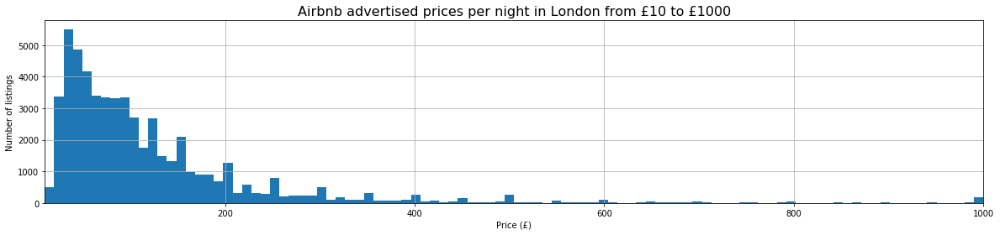

In [104]:
#Importing matplotlib library
import matplotlib.pyplot as plt
# Distribution of prices from £10 to £1000
plt.figure(figsize=(20,4))
df_merged_london2.Price.hist(bins=100, range=(10,1000))
plt.margins(x=0)
#plt.axvline(200, color='orange', linestyle='--')
plt.title("Airbnb advertised prices per night in London from £10 to £1000", fontsize=16)
plt.xlabel("Price (£)")
plt.ylabel("Number of listings")
plt.show()

Now what is the price distribution for price range £1000 - £20000? Let's see. 

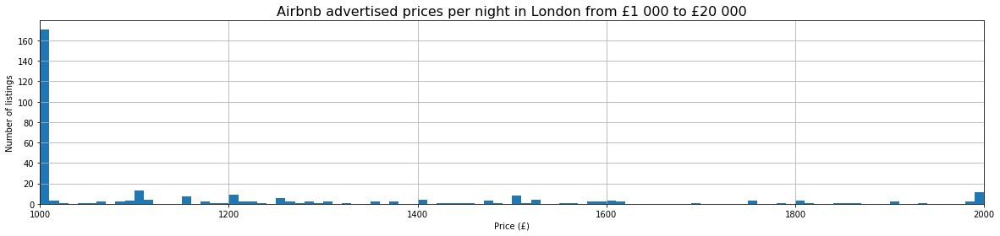

In [105]:
# Distribution of prices from £1000 to £20000
plt.figure(figsize=(20,4))
df_merged_london2.Price.hist(bins=100, range=(1000,2000))
plt.margins(x=0)
#plt.axvline(200, color='orange', linestyle='--')
plt.title("Airbnb advertised prices per night in London from £1 000 to £20 000", fontsize=16)
plt.xlabel("Price (£)")
plt.ylabel("Number of listings")
plt.show()

Based on the price distribution results above, it is quite reasonable to create a new dataframe which only includes prices up to £200. This will be useful for exploring the mean prices for each Borough and Neighbourhood. However, this new dataframe will not be used for exploring price vs property type.  

In [106]:
# Creating a new dataframe with prices up to £200 per night in London.
df_merged_london3 = df_merged_london2
london_higher200 =  df_merged_london3[df_merged_london3['Price'] > 200].index
df_merged_london3.drop(london_higher200, inplace = True)
df_london200 = df_merged_london3
df_london200.head()

,PostCode,Neighbourhood,Borough,Neighbourhood Postcode,Latitude,Longitude,Nearest Train Station,Distance to Station,London Zone,Property Type,Room Type,Price,Location Review Scores
0,BR1 1HW,Bromley Town,Bromley,BR1,51.400948,0.013574,Bromley South,0.282734,5,Apartment,Entire home/apt,69.0,10.0
1,BR1 1HW,Bromley Town,Bromley,BR1,51.400948,0.013574,Bromley South,0.282734,5,House,Entire home/apt,69.0,10.0
2,BR1 1HW,Bromley Town,Bromley,BR1,51.400948,0.013574,Bromley South,0.282734,5,Bungalow,Entire home/apt,89.0,10.0
3,BR1 1JB,Bromley Town,Bromley,BR1,51.402570,0.014396,Bromley South,0.351683,5,House,Private room,25.0,9.0
4,BR1 1NA,Bromley Town,Bromley,BR1,51.405563,0.015534,Bromley North,0.323242,4,Apartment,Entire home/apt,119.0,10.0


In [107]:
# Creating a new dataframe with number of Airbnb listings and mean price for each borough
df_london_borough = pd.DataFrame(df_merged_london2.groupby('Borough').size())
df_london_borough.rename(columns={0: 'Borough Listings'}, inplace=True)
df_london_borough['Mean price'] = df_merged_london2.groupby('Borough').Price.mean().round(2).values
#df_london_borough#.head()
df_london_borough.head()

,Borough Listings,Mean price
Borough,,
Barking and Dagenham,229,53.19
Barnet,969,65.24
Bexley,155,49.33
Brent,1529,68.46
Bromley,414,58.73


In [111]:
# Creating a new dataframe with number of Airbnb listings and mean price for each borough. This is for listings advertised for up to £200 per night.
df_london_borough2 = pd.DataFrame(df_london200.groupby('Borough').size())
df_london_borough2.rename(columns={0: 'Borough Listings'}, inplace=True)
df_london_borough2['Mean price'] = df_london200.groupby('Borough').Price.mean().round(2).values
df_london_borough2.head()

,Borough Listings,Mean price
Borough,,
Barking and Dagenham,229,53.19
Barnet,969,65.24
Bexley,155,49.33
Brent,1529,68.46
Bromley,414,58.73


In [112]:
df_london_borough2.shape

(33, 2)

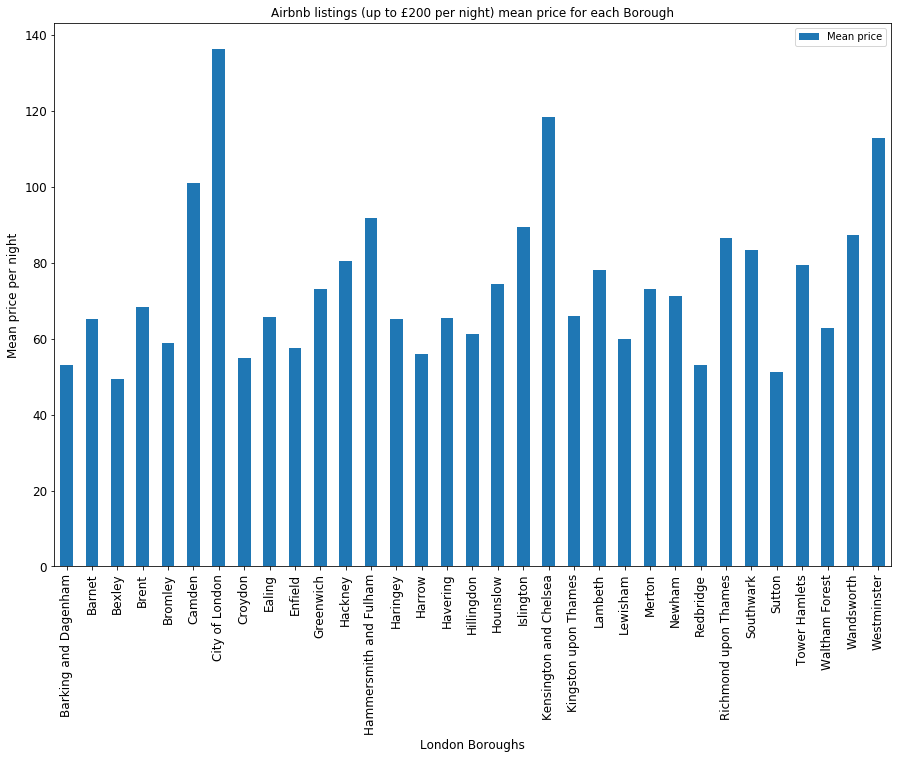

In [113]:
import matplotlib.pyplot as plt
ax = df_london_borough2[['Mean price']].plot(kind='bar', 
                                                   title ="Airbnb listings (up to £200 per night) mean price for each Borough", 
                                                   figsize=(15, 10), 
                                                   legend=True, fontsize=12)
ax.set_xlabel("London Boroughs", fontsize=12)
ax.set_ylabel("Mean price per night", fontsize=12)
plt.show()


Let's see how the above Airbnb mean price per night compares with the mean property purchase price for 2016-2017 for each London Borough. To give a better insight, other regions within the UK have been included for mean price comparison in the same period.

In [114]:
df_property_mean_price2 = df_property_mean_price[['Borough', 'Mean_Price']].reset_index()
df_property_mean_price2.head()

,index,Borough,Mean_Price
0,7965,City of London,950760
1,7966,Barking and Dagenham,301518
2,7967,Barnet,667593
3,7968,Bexley,357779
4,7969,Brent,578705


In [115]:
#Dropping the unwanted index column
df_property_mean_price3 = df_property_mean_price2[['Borough', 'Mean_Price']]
df_property_mean_price3.set_index('Borough')
df_property_mean_price3.head()

,Borough,Mean_Price
0,City of London,950760
1,Barking and Dagenham,301518
2,Barnet,667593
3,Bexley,357779
4,Brent,578705


In [116]:
df_property_mean_price3.shape

(45, 2)

ax = df_property_mean_price3[['Mean_Price']].plot(kind='bar', 
                                                   title ="London property mean prices for each Borough (2016-2017)", 
                                                   figsize=(15, 10), 
                                                   legend=True, fontsize=12)
ax.set_xlabel("London Boroughs", fontsize=12)
ax.set_ylabel("Mean property price(£)", fontsize=12)
plt.show()


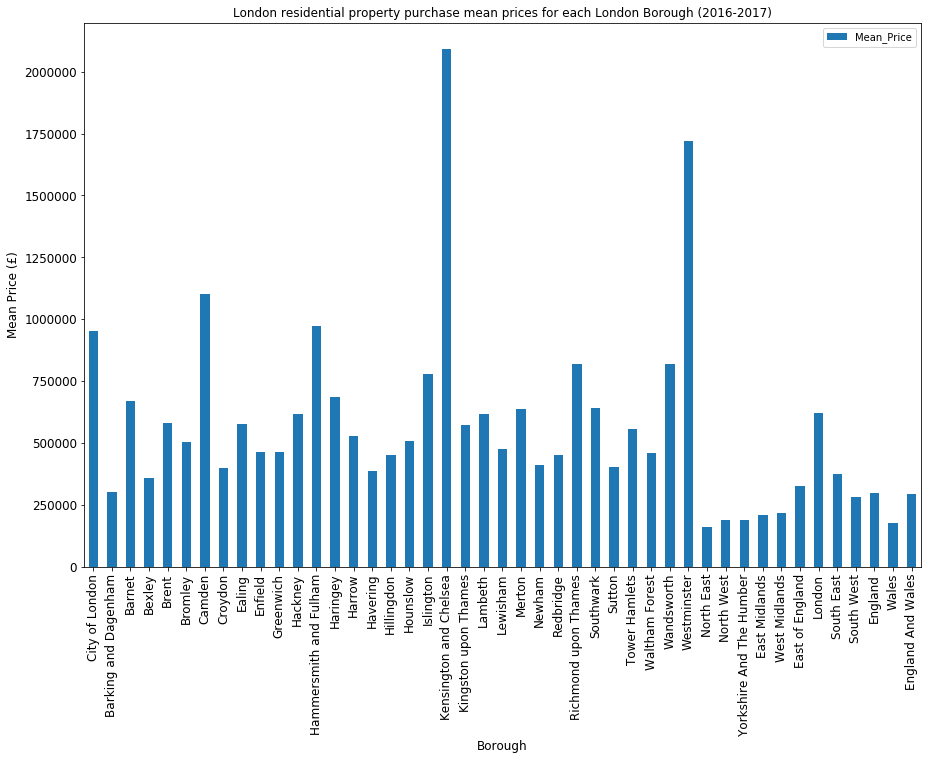

In [117]:
#Plotting bar charts for London residential property purchase mean prices for each London Borough (2016-2017
df_property_mean_price3.plot.bar(x='Borough', y='Mean_Price', figsize =(15,10), title="London residential property purchase mean prices for each London Borough (2016-2017)",
                                fontsize = 12);
plt.ylabel('Mean Price (£)', fontsize = 12)
plt.xlabel('Borough', fontsize = 12)
plt.show();

From the results above it can be observed that the most expensive properties are in the Borough of Kensington and Chelsea followed by Westeminster. Also, London generally has the most expensive properties compared to any other region within England and Wales.

Now let's see how crime rate relates to with Airbnb mean price per night and the property purchase mean price for each London Borough. 

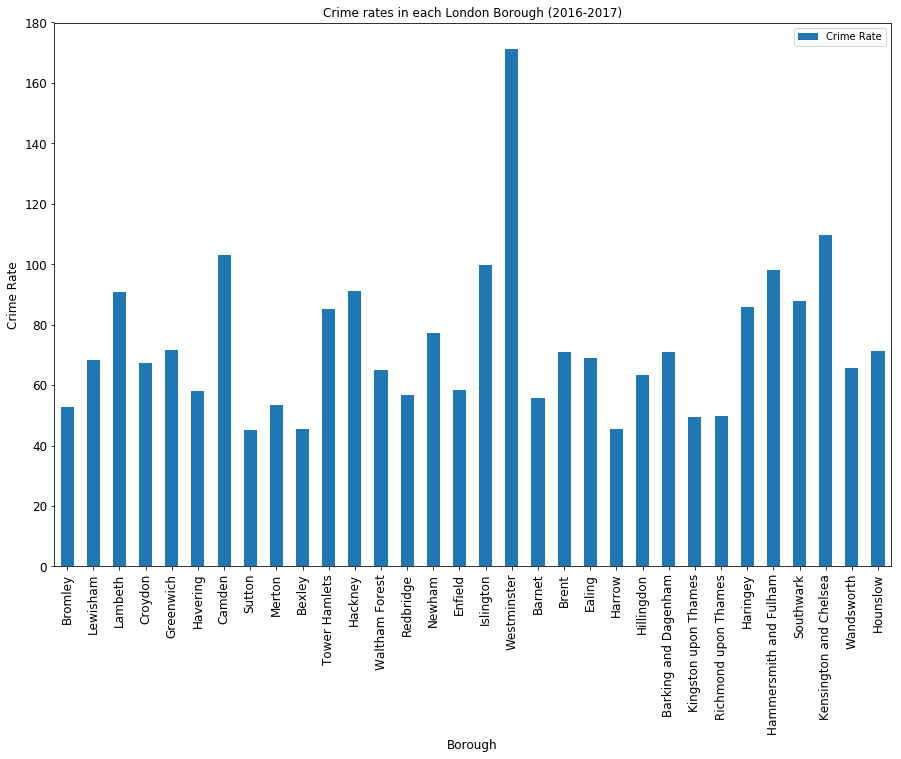

In [118]:
#Plotting bar charts for crime rates in each London Borough (2016-2017)
df_london_crime3.plot.bar(x='Borough', y='Crime Rate', figsize =(15,10), title="Crime rates in each London Borough (2016-2017)",
                               fontsize = 12 );
plt.ylabel('Crime Rate',fontsize = 12)
plt.xlabel('Borough', fontsize = 12)
plt.show();

It can be seen that Westminster had the highest crime rate and Kensington and Chelsea was second. 

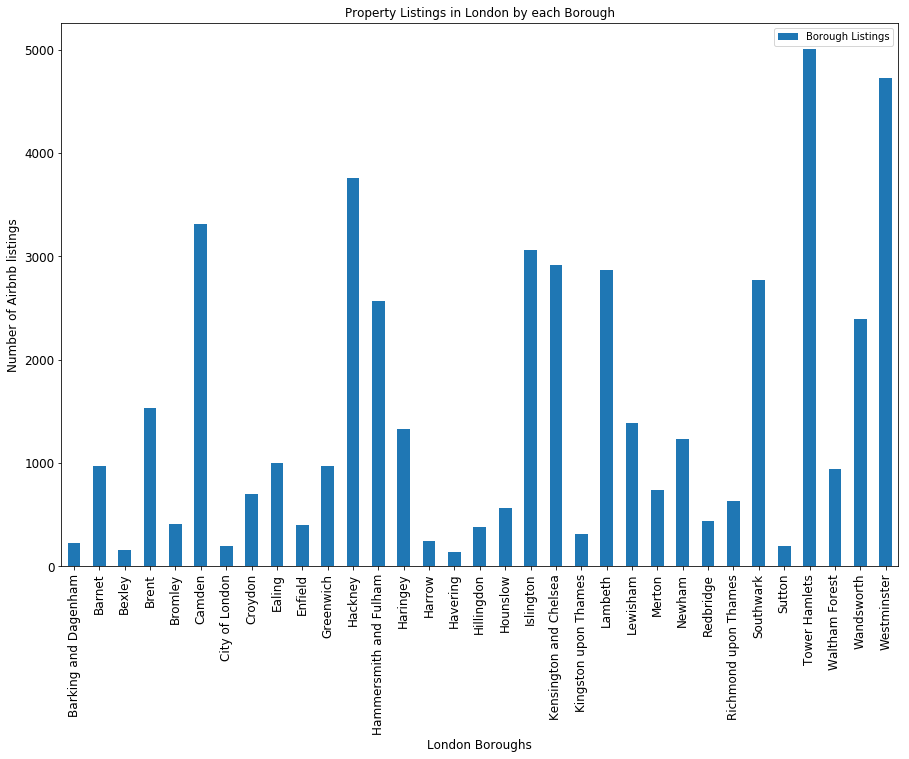

In [119]:
import matplotlib.pyplot as plt
ax = df_london_borough2[['Borough Listings']].plot(kind='bar', 
                                                   title ="Property Listings in London by each Borough", 
                                                   figsize=(15, 10), 
                                                   legend=True, fontsize=12)
ax.set_xlabel("London Boroughs", fontsize=12)
ax.set_ylabel("Number of Airbnb listings", fontsize=12)
plt.show()

In [120]:
# Creating a new dataframe with number of Airbnb listings and mean price for each neighbourhood. This is for listings advertised for up to £200 per night.
df_london_neighbs = pd.DataFrame(df_london200.groupby('Neighbourhood').size())
df_london_neighbs.rename(columns={0: 'Neighbourhood Listings'}, inplace=True)
df_london_neighbs['Mean price'] = df_london200.groupby('Neighbourhood').Price.mean().round(2).values
#df_london_neighbs['Property Type'] = df_london200.groupby('Neighbourhood').Property Type.str()
df_london_neighbs.head()

,Neighbourhood Listings,Mean price
Neighbourhood,,
Abbey,116,70.44
Abbey Road,85,116.86
Abbey Wood,41,59.00
Abingdon,165,122.55
Acton Central,135,59.36


In [121]:
#Checking number of neighbourhoods in London
df_london_neighbs.shape

(636, 2)

It can be deduced from the results above that London has 636 neighbourhoods and it is not cost effective to plot 636 graphs for each neighbourhood. At this point it is more reasonable to select the top ten neighbourhoods by mean price value per night.

In [122]:
df_london20_neighbs = df_london_neighbs.reset_index()
df_london20_neighbs.sort_values(by=['Mean price'], ascending=True)
df_london20_neighbs.head()

,Neighbourhood,Neighbourhood Listings,Mean price
0,Abbey,116,70.44
1,Abbey Road,85,116.86
2,Abbey Wood,41,59.00
3,Abingdon,165,122.55
4,Acton Central,135,59.36


Let's see which neighbourhoods have highest prices for listings costing up to £200 per night?

In [123]:
df_london_borough20 = df_london_neighbs.sort_values(['Mean price'], ascending=False)
#df_london_borough20 = df_london_neighbs.sort_values(['Neighbourhood Listings','Mean price'], ascending=False)
df_london_borough20.head(20)

,Neighbourhood Listings,Mean price
Neighbourhood,,
Coleman Street,3,200.00
Cordwainer,1,200.00
Billingsgate,2,192.00
Langbourn,1,169.00
Aldgate,2,165.00
Lime Street,5,163.00
Vintry,7,157.14
Cheap,4,152.25
Castle Baynard,26,151.35


The results above clearly show that we cannot use price alone to determine a good location for to acquire an investment property. Now let's see a comparison with listings and higher price per night up to £200? 

In [125]:
#df_london_borough20 = df_london_neighbs.sort_values(['Mean price'], ascending=False)
df_london_borough_20 = df_london_neighbs.sort_values(['Neighbourhood Listings','Mean price'], ascending=False)
df_london_borough_20.head(10)

,Neighbourhood Listings,Mean price
Neighbourhood,,
St Peter's,735,83.16
Whitechapel,655,93.07
Weavers,610,90.80
Lancaster Gate,562,103.88
Spitalfields & Banglatown,562,85.62
Hyde Park,471,121.27
Hoxton East & Shoreditch,443,98.95
West End,426,132.81
Regent's Park,411,91.71


Now lets explore this list further to understand why the number of listings (and assumed demand) for Airbnb rentals are high. 

We will start by visualizing the locations on a map.

In [126]:
lon_neighbs2 = df_london_borough_20.head(10)
#Merging the two dataframes ON the ['Neighbourhood'] column which is common in both dataframes
lon_neighbs201 = pd.merge(lon_neighbs2, df_london200, on = ['Neighbourhood'], how = 'inner')
#['PostCode','Neighbourhood','Borough','Latitude','Longitude']
lon_neighbs201.head()

,Neighbourhood,Neighbourhood Listings,Mean price,PostCode,Borough,Neighbourhood Postcode,Latitude,Longitude,Nearest Train Station,Distance to Station,London Zone,Property Type,Room Type,Price,Location Review Scores
0,St Peter's,735,83.16,E1 5AY,Tower Hamlets,E1,51.523466,-0.058477,Bethnal Green,0.090481,2,Apartment,Shared room,74.0,NaN
1,St Peter's,735,83.16,E1 5DH,Tower Hamlets,E1,51.522803,-0.061345,Bethnal Green,0.174299,2,Apartment,Entire home/apt,149.0,10.0
2,St Peter's,735,83.16,E1 5DH,Tower Hamlets,E1,51.522803,-0.061345,Bethnal Green,0.174299,2,Apartment,Entire home/apt,69.0,9.0
3,St Peter's,735,83.16,E1 5DH,Tower Hamlets,E1,51.522803,-0.061345,Bethnal Green,0.174299,2,Apartment,Entire home/apt,78.0,9.0
4,St Peter's,735,83.16,E1 5DH,Tower Hamlets,E1,51.522803,-0.061345,Bethnal Green,0.174299,2,Apartment,Entire home/apt,109.0,NaN


In [128]:
lon_neighbs201.shape

(5271, 15)

In [129]:
lon_neighbs201.isnull().sum()

Neighbourhood               0
Neighbourhood Listings      0
Mean price                  0
PostCode                    0
Borough                     0
Neighbourhood Postcode      0
Latitude                    0
Longitude                   0
Nearest Train Station       0
Distance to Station         0
London Zone                 0
Property Type               0
Room Type                   0
Price                       0
Location Review Scores    967
dtype: int64

In [130]:
lon_neighbs201.dropna(axis = 0, how = 'any', inplace = True)
lon_neighbs201.isnull().sum()

Neighbourhood             0
Neighbourhood Listings    0
Mean price                0
PostCode                  0
Borough                   0
Neighbourhood Postcode    0
Latitude                  0
Longitude                 0
Nearest Train Station     0
Distance to Station       0
London Zone               0
Property Type             0
Room Type                 0
Price                     0
Location Review Scores    0
dtype: int64

In [131]:
lon_neighbs201.shape

(4304, 15)

In [132]:
#Limiting the dataframe size to 600 rows due to limited computing power
lon_neighbs600 = lon_neighbs201.head(600)
lon_neighbs600.head()

,Neighbourhood,Neighbourhood Listings,Mean price,PostCode,Borough,Neighbourhood Postcode,Latitude,Longitude,Nearest Train Station,Distance to Station,London Zone,Property Type,Room Type,Price,Location Review Scores
1,St Peter's,735,83.16,E1 5DH,Tower Hamlets,E1,51.522803,-0.061345,Bethnal Green,0.174299,2,Apartment,Entire home/apt,149.0,10.0
2,St Peter's,735,83.16,E1 5DH,Tower Hamlets,E1,51.522803,-0.061345,Bethnal Green,0.174299,2,Apartment,Entire home/apt,69.0,9.0
3,St Peter's,735,83.16,E1 5DH,Tower Hamlets,E1,51.522803,-0.061345,Bethnal Green,0.174299,2,Apartment,Entire home/apt,78.0,9.0
6,St Peter's,735,83.16,E1 5DN,Tower Hamlets,E1,51.522477,-0.060667,Bethnal Green,0.177002,2,Apartment,Private room,35.0,9.0
7,St Peter's,735,83.16,E1 5DS,Tower Hamlets,E1,51.523067,-0.060988,Bethnal Green,0.136129,2,Apartment,Entire home/apt,90.0,9.0


In [133]:

#lon_neighbs20 = df_london_borough_20.head(20)
for lati, longi, borough, neighbourhood in zip (lon_neighbs600['Latitude'], lon_neighbs600['Longitude'], lon_neighbs600['Borough'], lon_neighbs600['Neighbourhood']):
    label = '{}, {}'.format(neighbourhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lati, longi],
        radius=5,
        popup=label,
        color='orange',
        fill=True,
        fill_color='blue',
        fill_opacity=0.6,
        parse_html=False).add_to(london_map)
london_map

In [134]:
locs_df2 = lon_neighbs201.head(2500)

In [135]:
locs_map2 = folium.Map(location=[latitude, longitude],
                      zoom_start=11, tiles='cartodbpositron')

feature_Hse = folium.FeatureGroup(name='House')
feature_TwnHse = folium.FeatureGroup(name='Townhouse')
feature_Bung = folium.FeatureGroup(name='Bungalow')
feature_Apt = folium.FeatureGroup(name='Apartment')
feature_Cond = folium.FeatureGroup(name='Condominium')
feature_Bnb = folium.FeatureGroup(name='Bed and breakfast')
feature_Htl = folium.FeatureGroup(name='Hotel')
feature_Othr = folium.FeatureGroup(name='Other')


for i, v in locs_df2.iterrows():
    popup = """
    Borough : <b>%s</b><br>
    Property type : <b>%s</b><br>
    Neighbourhood : <b>%s</b><br>
    Price : <b>%d</b><br>
    """ % (v['Borough'], v['Property Type'], v['Neighbourhood'], v['Price'])
    
    if v['Property Type'] == 'House':
        folium.CircleMarker(location=[v['Latitude'], v['Longitude']],
                            radius=2,
                            tooltip=popup,
                            color='lightgreen',
                            fill_color='lightgreen',
                            fill=True).add_to(feature_Hse)
        
    elif v['Property Type'] == 'Townhouse':
        folium.CircleMarker(location=[v['Latitude'], v['Longitude']],
                            radius=2,
                            tooltip=popup,
                            color='lavender',
                            fill_color='lavender',
                            fill=True).add_to(feature_TwnHse)
        
    elif v['Property Type'] == 'Bungalow':
        folium.CircleMarker(location=[v['Latitude'], v['Longitude']],
                            radius=2,
                            tooltip=popup,
                            color='yellow',
                            fill_color='yellow',
                            fill=True).add_to(feature_Bung)
        
    elif v['Property Type'] == 'Apartment':
        folium.CircleMarker(location=[v['Latitude'], v['Longitude']],
                            radius=2,
                            tooltip=popup,
                            color='darkblue',
                            fill_color='darkblue',
                            fill=True).add_to(feature_Apt)
        
    elif v['Property Type'] == 'Condominium':
        folium.CircleMarker(location=[v['Latitude'], v['Longitude']],
                            radius=2,
                            tooltip=popup,
                            color='lightskyblue',
                            fill_color='lightskyblue',
                            fill=True).add_to(feature_Cond)
        
    elif v['Property Type'] == 'Bed and breakfast':
        folium.CircleMarker(location=[v['Latitude'], v['Longitude']],
                            radius=2,
                            tooltip=popup,
                            color='brown',
                            fill_color='brown',
                            fill=True).add_to(feature_Bnb)
        
    elif v['Property Type'] == 'Hotel':
        folium.CircleMarker(location=[v['Latitude'], v['Longitude']],
                            radius=2,
                            tooltip=popup,
                            color='darksalmon',
                            fill_color='darksalmon',
                            fill=True).add_to(feature_Htl)
    else:
    
        v['Property Type'] == 'Other',
        folium.CircleMarker(location=[v['Latitude'], v['Longitude']],
                            radius=2,
                            tooltip=popup,
                            color='red',
                            fill_color='red',
                            legend=True,
                            fill=True).add_to(feature_Othr)

feature_Hse.add_to(locs_map2)
feature_TwnHse.add_to(locs_map2)
feature_Bung.add_to(locs_map2)
feature_Apt.add_to(locs_map2)
feature_Cond.add_to(locs_map2)
feature_Bnb.add_to(locs_map2)
feature_Htl.add_to(locs_map2)
feature_Othr.add_to(locs_map2)
folium.LayerControl(collapsed=False).add_to(locs_map2)

locs_map2

In [136]:
lon_neighbs201.shape


(4304, 15)

In [137]:
locs_df2.shape

(2500, 15)

Due to limited computing power, only 2500 out of 6807 datapoints were displayed on the map. 

In [119]:
#!conda install -c conda-forge geopy --yes 
#from geopy.geocoders import Nominatim 

## Now we are going to focus on exploring and clustering neighbourhoods in the top 20 by number of Airbnb listings

### Next step is to use the Foursquare API to explore and segment the neighbourhoods within the top 20 by Airbnb number of listings.

In [138]:
# The code was removed by Watson Studio for sharing.

My credentails are:


df_merg_trial = pd.merge(df_london_postcode1, lon_neighbs201, on = ['Neighbourhood'], how = 'inner')
df_merg_trial.head()

In [139]:

trial_df = lon_neighbs201[['Neighbourhood','Neighbourhood Postcode','Borough','Latitude','Longitude','Mean price']]#.unique()
#trial_df.columns = ['PostCode', 'Neighbourhood','Neighbourhood Postcode','Borough','Latitude','Longitude']
trial_df.head()

,Neighbourhood,Neighbourhood Postcode,Borough,Latitude,Longitude,Mean price
1,St Peter's,E1,Tower Hamlets,51.522803,-0.061345,83.16
2,St Peter's,E1,Tower Hamlets,51.522803,-0.061345,83.16
3,St Peter's,E1,Tower Hamlets,51.522803,-0.061345,83.16
6,St Peter's,E1,Tower Hamlets,51.522477,-0.060667,83.16
7,St Peter's,E1,Tower Hamlets,51.523067,-0.060988,83.16


In [140]:
trial_df.shape

(4304, 6)

In [141]:
trial_df2 = trial_df['Neighbourhood'].unique()
df_top_neighbourhoods = pd.DataFrame(trial_df2)
df_top_neighbourhoods.columns = ['Neighbourhood']
df_top_neighbourhoods#.head()

,Neighbourhood
0,St Peter's
1,Whitechapel
2,Weavers
3,Lancaster Gate
4,Spitalfields & Banglatown
5,Hyde Park
6,Hoxton East & Shoreditch
7,West End
8,Regent's Park
9,Holborn and Covent Garden


In [143]:
df_merg_top10 = pd.merge(df_top_neighbourhoods, df_london_map1, on = ['Neighbourhood'], how = 'inner')
df_merg_top10.head()

,Neighbourhood,PostCode,Neighbourhood Postcode,Borough,Latitude,Longitude
0,St Peter's,E1 5AY,E1,Tower Hamlets,51.523466,-0.058477
1,St Peter's,E1 5DH,E1,Tower Hamlets,51.522803,-0.061345
2,St Peter's,E1 5DH,E1,Tower Hamlets,51.522803,-0.061345
3,St Peter's,E1 5DH,E1,Tower Hamlets,51.522803,-0.061345
4,St Peter's,E1 5DH,E1,Tower Hamlets,51.522803,-0.061345


df_merg_trial = pd.merge(trial_df, df_london_map1, on = ['Neighbourhood'], how = 'left')
df_merg_trial.head()

In [144]:
df_merg_top10.shape

(6517, 6)

In [145]:
df_merg_top10.dtypes

Neighbourhood              object
PostCode                   object
Neighbourhood Postcode     object
Borough                    object
Latitude                  float64
Longitude                 float64
dtype: object

df_St_Peters = df_merg_trial[df_merg_trial['Neighbourhood'] == 'St Peter\'s']
df_St_Peters.head()

df_St_Peters.shape

The next step is to explore each neighbourhood in the top 20 list by number od Airbnb listing. This will be achieved by using a function to carry out the following procedure:

1. Extracting each neighbourhood's geographical coordinates.
2. Extracting the top 100 venues (including category type) within a 200m radius for each neighbourhood.
3. Clean the json data and convert the data into a pandas dataframe.

In [161]:
#Defining the to get nearby venues
def getNearbyVenues(names, latitudes, longitudes, radius):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # Creating the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # Making the GET request to extract json data
        #results = requests.get(url).json()["response"]["groups"][0]['items']
        #results = requests.get(url).json()["response"]['groups'][0]['items']
        results = requests.get(url).json()["response"]#['groups']['items']
        # return only relevant information for each nearby venue
        venues_list.extend([(
            name, 
            lat, 
            lng, 
            v['venue']['name'],
            v['venue']['location']['lat'],
            v['venue']['location']['lng'],
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame(venues_list, columns = ['Neighbourhood',
    'Neighbourhood Latitude', 'Neighbourhood Longitude', 'Venue',
    'Venue Latitude', 'Venue Longitude', 'Venue Category'])
                      
    return(nearby_venues)

In [162]:
#Calling the getNearbyVenues function for each neighbourhood to create a dataframe lon_venues
lond = df_merg_top10.head(2560) # This corresponds to top 4 neighbourhoods by Airbnb listings
LIMIT = 5
lon_venues = getNearbyVenues (names = lond['Neighbourhood'],
                                       latitudes = lond['Latitude'],
                                       longitudes = lond['Longitude'],
                              radius = 200
                                      )
lon_venues.head()

St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's
St Peter's

TypeError: string indices must be integers

In [153]:
#Size of resulting dataframe
london_venues = lon_venues
london_venues.shape

NameError: name 'lon_venues' is not defined

In [260]:
#First 5 rows of the resulting london_venues dataframe
london_venues.head(15)

,Neighbourhood,Neighbourhood Latitude,Neighbourhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,St Peter's,51.523466,-0.058477,Mechanic Brewery,51.523666,-0.056916,Brewery
1,St Peter's,51.523466,-0.058477,Platform 1,51.523791,-0.060360,Platform
2,St Peter's,51.522803,-0.061345,Platform 1,51.523791,-0.060360,Platform
3,St Peter's,51.522803,-0.061345,Platform 1,51.523791,-0.060360,Platform
4,St Peter's,51.522803,-0.061345,Platform 1,51.523791,-0.060360,Platform
5,St Peter's,51.522803,-0.061345,Platform 1,51.523791,-0.060360,Platform
6,St Peter's,51.522803,-0.061345,Platform 1,51.523791,-0.060360,Platform
7,St Peter's,51.522477,-0.060667,Platform 1,51.523791,-0.060360,Platform
8,St Peter's,51.523067,-0.060988,Platform 1,51.523791,-0.060360,Platform
9,St Peter's,51.523067,-0.060988,Platform 1,51.523791,-0.060360,Platform


 ### Checking how many venues have been returned for each neighbourhood and how many venue categories can be curated from the returned data.

In [261]:
#Number of venues for each neighbourhood
london_venues.groupby('Neighbourhood').count()

,Neighbourhood Latitude,Neighbourhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighbourhood,,,,,,
Lancaster Gate,2090,2090,2090,2090,2090,2090
St Peter's,3406,3406,3406,3406,3406,3406
Weavers,3189,3189,3189,3189,3189,3189
Whitechapel,3159,3159,3159,3159,3159,3159


In [262]:
#Checking unique venue categories
print('There are {} uniques categories.'.format(len(london_venues['Venue Category'].unique())))

There are 114 uniques categories.


### Next step is to analyze each neighbourhood

In [263]:
# London one hot encoding
london_onehot = pd.get_dummies(london_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
london_onehot['Neighbourhood'] = london_venues['Neighbourhood'] 

# move neighborhood column to the first column
fixed_columns = [london_onehot.columns[-1]] + list(london_onehot.columns[:-1])
london_onehot = london_onehot[fixed_columns]

london_onehot.head()

,Neighbourhood,Afghan Restaurant,American Restaurant,Arepa Restaurant,Art Gallery,Arts & Crafts Store,Asian Restaurant,BBQ Joint,Bagel Shop,Bakery,Bar,Beer Bar,Beer Store,Bookstore,Boutique,Boxing Gym,Breakfast Spot,Brewery,Burger Joint,Burrito Place,Bus Stop,Café,Camera Store,Canal,Canal Lock,Caucasian Restaurant,Cheese Shop,Chinese Restaurant,Clothing Store,Cocktail Bar,Coffee Shop,Comedy Club,Community College,Convenience Store,Cosmetics Shop,Creperie,Deli / Bodega,Dim Sum Restaurant,Dive Bar,English Restaurant,Event Space,Falafel Restaurant,Farm,Fast Food Restaurant,Fish Market,Flower Shop,Food & Drink Shop,French Restaurant,Fried Chicken Joint,Furniture / Home Store,Garden,Gastropub,Gay Bar,...,Indie Movie Theater,Italian Restaurant,Japanese Restaurant,Jewelry Store,Kebab Restaurant,Korean Restaurant,Latin American Restaurant,Liquor Store,Malay Restaurant,Market,Martial Arts Dojo,Mediterranean Restaurant,Middle Eastern Restaurant,Modern European Restaurant,Movie Theater,Music Venue,Nightclub,North Indian Restaurant,Organic Grocery,Paper / Office Supplies Store,Park,Peruvian Restaurant,Pharmacy,Photography Studio,Pilates Studio,Pizza Place,Platform,Plaza,Print Shop,Pub,Public Art,Recreation Center,Restaurant,Salon / Barbershop,Sandwich Place,Shoe Store,Social Club,Southern / Soul Food Restaurant,Spa,Stables,Steakhouse,Supermarket,Sushi Restaurant,Tapas Restaurant,Theater,Theme Restaurant,Thrift / Vintage Store,Trail,Turkish Restaurant,Veneto Restaurant,Wine Bar,Women's Store,Yoga Studio
11839,Lancaster Gate,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
11840,Lancaster Gate,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
11841,Lancaster Gate,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
11842,Lancaster Gate,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
11843,Lancaster Gate,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [264]:
london_onehot.shape

(11844, 115)

### The next step is to group rows by neighbourhood and by taking the mean of the frequency of occurence of each venue category

In [265]:
#Remember neighbourhoods are grouped by the same Neighbourhood Post Code.
london_group = london_onehot.groupby('Neighbourhood').mean().reset_index()
london_group

,Neighbourhood,Afghan Restaurant,American Restaurant,Arepa Restaurant,Art Gallery,Arts & Crafts Store,Asian Restaurant,BBQ Joint,Bagel Shop,Bakery,Bar,Beer Bar,Beer Store,Bookstore,Boutique,Boxing Gym,Breakfast Spot,Brewery,Burger Joint,Burrito Place,Bus Stop,Café,Camera Store,Canal,Canal Lock,Caucasian Restaurant,Cheese Shop,Chinese Restaurant,Clothing Store,Cocktail Bar,Coffee Shop,Comedy Club,Community College,Convenience Store,Cosmetics Shop,Creperie,Deli / Bodega,Dim Sum Restaurant,Dive Bar,English Restaurant,Event Space,Falafel Restaurant,Farm,Fast Food Restaurant,Fish Market,Flower Shop,Food & Drink Shop,French Restaurant,Fried Chicken Joint,Furniture / Home Store,Garden,Gastropub,Gay Bar,...,Indie Movie Theater,Italian Restaurant,Japanese Restaurant,Jewelry Store,Kebab Restaurant,Korean Restaurant,Latin American Restaurant,Liquor Store,Malay Restaurant,Market,Martial Arts Dojo,Mediterranean Restaurant,Middle Eastern Restaurant,Modern European Restaurant,Movie Theater,Music Venue,Nightclub,North Indian Restaurant,Organic Grocery,Paper / Office Supplies Store,Park,Peruvian Restaurant,Pharmacy,Photography Studio,Pilates Studio,Pizza Place,Platform,Plaza,Print Shop,Pub,Public Art,Recreation Center,Restaurant,Salon / Barbershop,Sandwich Place,Shoe Store,Social Club,Southern / Soul Food Restaurant,Spa,Stables,Steakhouse,Supermarket,Sushi Restaurant,Tapas Restaurant,Theater,Theme Restaurant,Thrift / Vintage Store,Trail,Turkish Restaurant,Veneto Restaurant,Wine Bar,Women's Store,Yoga Studio
0,Lancaster Gate,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.059330,0.000000,0.032536,0.000000,0.000000,0.069856,0.000000,0.000000,0.000000,0.000000,0.000000,0.076555,0.000000,0.001435,0.031579,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.014833,0.000000,0.000000,0.058373,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.00622,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.042584,0.000000,0.000000,0.000000,0.000000,0.014354,0.000000,0.124402,0.000000,0.000000,0.007177,0.000000,0.036364,0.00000,0.000000,0.000000,0.000000,0.000478,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,St Peter's,0.004991,0.000000,0.007927,0.032296,0.012918,0.000000,0.000000,0.000000,0.016735,0.020258,0.016442,0.004698,0.006753,0.00000,0.000881,0.001762,0.024956,0.002642,0.000881,0.000294,0.043453,0.000000,0.036994,0.020846,0.013799,0.003817,0.000000,0.003230,0.053435,0.102173,0.002642,0.001762,0.007340,0.003523,0.000000,0.000294,0.000000,0.000000,0.00000,0.001762,0.011744,0.010570,0.000000,0.007046,0.024075,0.000000,0.022607,0.000000,0.000881,0.000587,0.007634,0.000587,...,0.000000,0.026718,0.014974,0.000000,0.00000,0.002936,0.005872,0.000294,0.00000,0.001174,0.020846,0.001174,0.000000,0.000587,0.000294,0.000000,0.002349,0.000000,0.002936,0.000000,0.021139,0.005872,0.000000,0.000000,0.000000,0.016442,0.006753,0.000000,0.000000,0.186142,0.003523,0.000000,0.022607,0.000000,0.000000,0.00000,0.007340,0.000000,0.003817,0.000000,0.000294,0.002349,0.004991,0.000000,0.001174,0.000000,0.000000,0.005872,0.001762,0.002349,0.008221,0.000000,0.039342
2,Weavers,0.000000,0.000000,0.000000,0.000000,0.000000,0.001881,0.079649,0.088429,0.001568,0.000000,0.076827,0.001568,0.000000,0.00439,0.010348,0.000000,0.000000,0.000000,0.000000,0.000000,0.082471,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.001254,0.008153,0.053308,0.000000,0.000000,0.000000,0.019442,0.000000,0.000000,0.000000,0.000000,0.01317,0.000000,0.000000,0.014738,0.000000,0.000000,0.000314,0.000941,0.000000,0.008467,0.085607,0.016620,0.000000,0.000000,...,0.078708,0.034807,0.012857,0.003136,0.00000,0.000000,0.000000,0.000000,0.00000,0.01599

In [266]:
#checking shape of the resulting dataframe
london_group.shape

(4, 115)

### Next step is to print each neighbourhood with its top 20 most common venues

In [267]:
#Predefining the number of top venues to print. This number can be changed to suit.
top_venues = 20

# Using for loop to achieve the requirement. Remember that neighbourhoods are grouped by the same Neighbourhood Post Code.
for neighbourhood in london_group['Neighbourhood']:
    print("----" + neighbourhood+ "----")
    temp = london_group[london_group['Neighbourhood'] == neighbourhood].T.reset_index()
    temp.columns = ['venue', 'freq']
    temp = temp.iloc[1:]
    temp['freq']=temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending = False).reset_index(drop=True).head(top_venues))
    print('\n')
    

----Lancaster Gate----
                       venue  freq
0                      Hotel  0.20
1                        Pub  0.12
2           Greek Restaurant  0.12
3         Chinese Restaurant  0.08
4                       Café  0.07
5                     Garden  0.06
6             Breakfast Spot  0.06
7                   Pharmacy  0.04
8          Indian Restaurant  0.04
9             Sandwich Place  0.04
10              Burger Joint  0.03
11               Coffee Shop  0.03
12            Ice Cream Shop  0.03
13      Gym / Fitness Center  0.03
14                Restaurant  0.01
15         French Restaurant  0.01
16                     Plaza  0.01
17          Malay Restaurant  0.01
18  Mediterranean Restaurant  0.00
19                 Nightclub  0.00


----St Peter's----
                 venue  freq
0                  Pub  0.19
1          Coffee Shop  0.10
2         Cocktail Bar  0.05
3          Yoga Studio  0.04
4                Canal  0.04
5                 Café  0.04
6          Art Gal

### The next step is put the results into a pandas dataframe

First sub-step is to define a function which sorts the top venues in descending order 

In [268]:
#This function returns most frequent or most common venues
def return_top_venues(row, top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:top_venues]

The next sub-step is to create the pandas dataframe and display top 10 venues in each neighbourhood. Remember each neighbourhood is grouped by the same Neighbourhood Post Code.

In [269]:
#Predefining the number of top venues. This number can be changed if we need to print a different number of top venues e.g 9
top_venues = 10

indicators = ['st', 'nd', 'rd']

#Creating number of columns according to number of top venues
columns = ['Neighbourhood']
for ind in np.arange(top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

#Create the new dataframe
neighb_venues_sorted = pd.DataFrame(columns=columns)
neighb_venues_sorted['Neighbourhood'] = london_group['Neighbourhood']

for ind in np.arange(london_group.shape[0]):
    neighb_venues_sorted.iloc[ind, 1:] = return_top_venues(london_group.iloc[ind, :], top_venues)

london_group.head()

,Neighbourhood,Afghan Restaurant,American Restaurant,Arepa Restaurant,Art Gallery,Arts & Crafts Store,Asian Restaurant,BBQ Joint,Bagel Shop,Bakery,Bar,Beer Bar,Beer Store,Bookstore,Boutique,Boxing Gym,Breakfast Spot,Brewery,Burger Joint,Burrito Place,Bus Stop,Café,Camera Store,Canal,Canal Lock,Caucasian Restaurant,Cheese Shop,Chinese Restaurant,Clothing Store,Cocktail Bar,Coffee Shop,Comedy Club,Community College,Convenience Store,Cosmetics Shop,Creperie,Deli / Bodega,Dim Sum Restaurant,Dive Bar,English Restaurant,Event Space,Falafel Restaurant,Farm,Fast Food Restaurant,Fish Market,Flower Shop,Food & Drink Shop,French Restaurant,Fried Chicken Joint,Furniture / Home Store,Garden,Gastropub,Gay Bar,...,Indie Movie Theater,Italian Restaurant,Japanese Restaurant,Jewelry Store,Kebab Restaurant,Korean Restaurant,Latin American Restaurant,Liquor Store,Malay Restaurant,Market,Martial Arts Dojo,Mediterranean Restaurant,Middle Eastern Restaurant,Modern European Restaurant,Movie Theater,Music Venue,Nightclub,North Indian Restaurant,Organic Grocery,Paper / Office Supplies Store,Park,Peruvian Restaurant,Pharmacy,Photography Studio,Pilates Studio,Pizza Place,Platform,Plaza,Print Shop,Pub,Public Art,Recreation Center,Restaurant,Salon / Barbershop,Sandwich Place,Shoe Store,Social Club,Southern / Soul Food Restaurant,Spa,Stables,Steakhouse,Supermarket,Sushi Restaurant,Tapas Restaurant,Theater,Theme Restaurant,Thrift / Vintage Store,Trail,Turkish Restaurant,Veneto Restaurant,Wine Bar,Women's Store,Yoga Studio
0,Lancaster Gate,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.059330,0.000000,0.032536,0.000000,0.000000,0.069856,0.000000,0.000000,0.000000,0.000000,0.000000,0.076555,0.000000,0.001435,0.031579,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.014833,0.000000,0.000000,0.058373,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.00622,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.042584,0.000000,0.000000,0.000000,0.000000,0.014354,0.000000,0.124402,0.000000,0.000000,0.007177,0.000000,0.036364,0.00000,0.000000,0.000000,0.000000,0.000478,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,St Peter's,0.004991,0.000000,0.007927,0.032296,0.012918,0.000000,0.000000,0.000000,0.016735,0.020258,0.016442,0.004698,0.006753,0.00000,0.000881,0.001762,0.024956,0.002642,0.000881,0.000294,0.043453,0.000000,0.036994,0.020846,0.013799,0.003817,0.000000,0.003230,0.053435,0.102173,0.002642,0.001762,0.007340,0.003523,0.000000,0.000294,0.000000,0.000000,0.00000,0.001762,0.011744,0.010570,0.000000,0.007046,0.024075,0.000000,0.022607,0.000000,0.000881,0.000587,0.007634,0.000587,...,0.000000,0.026718,0.014974,0.000000,0.00000,0.002936,0.005872,0.000294,0.00000,0.001174,0.020846,0.001174,0.000000,0.000587,0.000294,0.000000,0.002349,0.000000,0.002936,0.000000,0.021139,0.005872,0.000000,0.000000,0.000000,0.016442,0.006753,0.000000,0.000000,0.186142,0.003523,0.000000,0.022607,0.000000,0.000000,0.00000,0.007340,0.000000,0.003817,0.000000,0.000294,0.002349,0.004991,0.000000,0.001174,0.000000,0.000000,0.005872,0.001762,0.002349,0.008221,0.000000,0.039342
2,Weavers,0.000000,0.000000,0.000000,0.000000,0.000000,0.001881,0.079649,0.088429,0.001568,0.000000,0.076827,0.001568,0.000000,0.00439,0.010348,0.000000,0.000000,0.000000,0.000000,0.000000,0.082471,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.001254,0.008153,0.053308,0.000000,0.000000,0.000000,0.019442,0.000000,0.000000,0.000000,0.000000,0.01317,0.000000,0.000000,0.014738,0.000000,0.000000,0.000314,0.000941,0.000000,0.008467,0.085607,0.016620,0.000000,0.000000,...,0.078708,0.034807,0.012857,0.003136,0.00000,0.000000,0.000000,0.000000,0.00000,0.01599

In [270]:
london_group.shape

(4, 115)

distortions = []
K = range(1,10)
for k in K:
    kmeanModel = KMeans(n_clusters=k)
    kmeanModel.fit(london_group)
    distortions.append(kmeanModel.inertia_)

plt.figure(figsize=(16,8))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

## Next step is to cluster the neighbourhoods using k-Means Clustering Algorithm

The neighbourhoods are going to be clustered into 4 clusters

In [272]:
#Setting the number of clusters. This can be changed depending on number of clusters required
k = 4

london_group_cluster = london_group.drop('Neighbourhood', 1)

#Running k-means clustering
kmeans_cluster = KMeans(n_clusters=k, random_state=0).fit(london_group_cluster)

#Checking cluster labels generated for each row in the dataframe
kmeans_cluster.labels_[0:10] 

array([0, 3, 1, 2], dtype=int32)

Creating a dataframe that includes the kmeans_cluster and top 10 venues for each neighbourhood

In [273]:
#Adding clustering labels
neighb_venues_sorted.insert(0, 'Cluster Labels', kmeans_cluster.labels_)

lond_merg = lond

#Merging neighbourhoods top 10 venues with london top 20 neighbourhoods data (lond) to add latitude and longitude for each neighborhood
lond_merg = lond_merg.join(neighb_venues_sorted.set_index('Neighbourhood'), on='Neighbourhood')

lond_merg.tail()

,Neighbourhood,PostCode,Neighbourhood Postcode,Borough,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
2557,Lancaster Gate,W2 3TA,W2,Westminster,51.513657,-0.18614,0,Hotel,Pub,Greek Restaurant,Chinese Restaurant,Café,Breakfast Spot,Garden,Indian Restaurant,Pharmacy,Sandwich Place
2558,Lancaster Gate,W2 3TA,W2,Westminster,51.513657,-0.18614,0,Hotel,Pub,Greek Restaurant,Chinese Restaurant,Café,Breakfast Spot,Garden,Indian Restaurant,Pharmacy,Sandwich Place
2559,Lancaster Gate,W2 3TA,W2,Westminster,51.513657,-0.18614,0,Hotel,Pub,Greek Restaurant,Chinese Restaurant,Café,Breakfast Spot,Garden,Indian Restaurant,Pharmacy,Sandwich Place
2560,Lancaster Gate,W2 3TA,W2,Westminster,51.513657,-0.18614,0,Hotel,Pub,Greek Restaurant,Chinese Restaurant,Café,Breakfast Spot,Garden,Indian Restaurant,Pharmacy,Sandwich Place
2561,Lancaster Gate,W2 3TA,W2,Westminster,51.513657,-0.18614,0,Hotel,Pub,Greek Restaurant,Chinese Restaurant,Café,Breakfast Spot,Garden,Indian Restaurant,Pharmacy,Sandwich Place


### Next step is to show the clusters on a map

In [289]:
#Using folium to create the cluster map
london_map_clusters = folium.Map(location=[51.5073219, -0.1276474], zoom_start=10)

#Setting colour scheme for the clusters. k is the number of clusters defined above
x = np.arange(k) # Come back to this ?????????????????????????????????
y = [i + x + (i*x)**2 for i in range(k)]
colors_array = cm.rainbow(np.linspace(0, 1, len(y)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

#Adding markers superimposed onto the map
markers_colors = []
for lat, lon, poi, cluster in zip(lond_merg['Latitude'], lond_merg['Longitude'], lond_merg['Neighbourhood'], lond_merg['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=2,
        popup=label,
        color=rainbow[cluster-1], # Come back to this???????????????????????????????
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.6).add_to(london_map_clusters)
#Displaying the clusters on a map       
london_map_clusters

## Next step is to examine the clusters to examine the disnguishing features for each cluster

## Cluster 1

In [280]:
lond_merg.loc[lond_merg['Cluster Labels'] == 0, lond_merg.columns[[1] + list(range(4, lond_merg.shape[1]))]]

,PostCode,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
2144,W2 3AA,51.513180,-0.182613,0,Hotel,Pub,Greek Restaurant,Chinese Restaurant,Café,Breakfast Spot,Garden,Indian Restaurant,Pharmacy,Sandwich Place
2145,W2 3AA,51.513180,-0.182613,0,Hotel,Pub,Greek Restaurant,Chinese Restaurant,Café,Breakfast Spot,Garden,Indian Restaurant,Pharmacy,Sandwich Place
2146,W2 3AA,51.513180,-0.182613,0,Hotel,Pub,Greek Restaurant,Chinese Restaurant,Café,Breakfast Spot,Garden,Indian Restaurant,Pharmacy,Sandwich Place
2147,W2 3AA,51.513180,-0.182613,0,Hotel,Pub,Greek Restaurant,Chinese Restaurant,Café,Breakfast Spot,Garden,Indian Restaurant,Pharmacy,Sandwich Place
2148,W2 3AA,51.513180,-0.182613,0,Hotel,Pub,Greek Restaurant,Chinese Restaurant,Café,Breakfast Spot,Garden,Indian Restaurant,Pharmacy,Sandwich Place
2149,W2 3AH,51.513825,-0.180714,0,Hotel,Pub,Greek Restaurant,Chinese Restaurant,Café,Breakfast Spot,Garden,Indian Restaurant,Pharmacy,Sandwich Place
2150,W2 3AH,51.513825,-0.180714,0,Hotel,Pub,Greek Restaurant,Chinese Restaurant,Café,Breakfast Spot,Garden,Indian Restaurant,Pharmacy,Sandwich Place
2151,W2 3AN,51.512879,-0.183970,0,Hotel,Pub,Greek Restaurant,Chinese Restaurant,Café,Breakfast Spot,Garden,Indian Restaurant,Pharmacy,Sandwich Place
2152,W2 3AN,51.512879,-0.183970,0,Hotel,Pub,Greek Restaurant,Chinese Restaurant,Café,Breakfast Spot,Garden,Indian Restaurant,Pharmacy,Sandwich Place
2153,W2 3AN,51.512879,-0.183970,0,Hotel,Pub,Greek Restaurant,Chinese Restaurant,Café,Breakfast Spot,Garden,Indian Restaurant,Pharmacy,Sandwich Place


## Cluster 2

In [276]:
lond_merg.loc[lond_merg['Cluster Labels'] == 1, lond_merg.columns[[1] + list(range(4, lond_merg.shape[1]))]]

,PostCode,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1496,E1 6FU,51.523653,-0.072440,1,Pub,Bagel Shop,Furniture / Home Store,Café,BBQ Joint,Indie Movie Theater,Beer Bar,Coffee Shop,Turkish Restaurant,Italian Restaurant
1497,E1 6GQ,51.524372,-0.072523,1,Pub,Bagel Shop,Furniture / Home Store,Café,BBQ Joint,Indie Movie Theater,Beer Bar,Coffee Shop,Turkish Restaurant,Italian Restaurant
1498,E1 6GR,51.523824,-0.073656,1,Pub,Bagel Shop,Furniture / Home Store,Café,BBQ Joint,Indie Movie Theater,Beer Bar,Coffee Shop,Turkish Restaurant,Italian Restaurant
1499,E1 6GR,51.523824,-0.073656,1,Pub,Bagel Shop,Furniture / Home Store,Café,BBQ Joint,Indie Movie Theater,Beer Bar,Coffee Shop,Turkish Restaurant,Italian Restaurant
1500,E1 6GR,51.523824,-0.073656,1,Pub,Bagel Shop,Furniture / Home Store,Café,BBQ Joint,Indie Movie Theater,Beer Bar,Coffee Shop,Turkish Restaurant,Italian Restaurant
1501,E1 6GT,51.524015,-0.073259,1,Pub,Bagel Shop,Furniture / Home Store,Café,BBQ Joint,Indie Movie Theater,Beer Bar,Coffee Shop,Turkish Restaurant,Italian Restaurant
1502,E1 6GT,51.524015,-0.073259,1,Pub,Bagel Shop,Furniture / Home Store,Café,BBQ Joint,Indie Movie Theater,Beer Bar,Coffee Shop,Turkish Restaurant,Italian Restaurant
1503,E1 6GT,51.524015,-0.073259,1,Pub,Bagel Shop,Furniture / Home Store,Café,BBQ Joint,Indie Movie Theater,Beer Bar,Coffee Shop,Turkish Restaurant,Italian Restaurant
1504,E1 6GT,51.524015,-0.073259,1,Pub,Bagel Shop,Furniture / Home Store,Café,BBQ Joint,Indie Movie Theater,Beer Bar,Coffee Shop,Turkish Restaurant,Italian Restaurant
1505,E1 6GT,51.524015,-0.073259,1,Pub,Bagel Shop,Furniture / Home Store,Café,BBQ Joint,Indie Movie Theater,Beer Bar,Coffee Shop,Turkish Restaurant,Italian Restaurant


In [281]:
lond_merg.loc[lond_merg['Cluster Labels'] == 2, lond_merg.columns[[1] + list(range(4, lond_merg.shape[1]))]]

,PostCode,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
791,E1 0BJ,51.510176,-0.061262,2,Hotel,Coffee Shop,Indian Restaurant,Middle Eastern Restaurant,Gym / Fitness Center,Sandwich Place,Grocery Store,Italian Restaurant,Pizza Place,Korean Restaurant
792,E1 0BJ,51.510176,-0.061262,2,Hotel,Coffee Shop,Indian Restaurant,Middle Eastern Restaurant,Gym / Fitness Center,Sandwich Place,Grocery Store,Italian Restaurant,Pizza Place,Korean Restaurant
793,E1 0BJ,51.510176,-0.061262,2,Hotel,Coffee Shop,Indian Restaurant,Middle Eastern Restaurant,Gym / Fitness Center,Sandwich Place,Grocery Store,Italian Restaurant,Pizza Place,Korean Restaurant
794,E1 0EX,51.510912,-0.061720,2,Hotel,Coffee Shop,Indian Restaurant,Middle Eastern Restaurant,Gym / Fitness Center,Sandwich Place,Grocery Store,Italian Restaurant,Pizza Place,Korean Restaurant
795,E1 0EX,51.510912,-0.061720,2,Hotel,Coffee Shop,Indian Restaurant,Middle Eastern Restaurant,Gym / Fitness Center,Sandwich Place,Grocery Store,Italian Restaurant,Pizza Place,Korean Restaurant
796,E1 0EX,51.510912,-0.061720,2,Hotel,Coffee Shop,Indian Restaurant,Middle Eastern Restaurant,Gym / Fitness Center,Sandwich Place,Grocery Store,Italian Restaurant,Pizza Place,Korean Restaurant
797,E1 0EY,51.510950,-0.061301,2,Hotel,Coffee Shop,Indian Restaurant,Middle Eastern Restaurant,Gym / Fitness Center,Sandwich Place,Grocery Store,Italian Restaurant,Pizza Place,Korean Restaurant
798,E1 0EZ,51.509543,-0.061605,2,Hotel,Coffee Shop,Indian Restaurant,Middle Eastern Restaurant,Gym / Fitness Center,Sandwich Place,Grocery Store,Italian Restaurant,Pizza Place,Korean Restaurant
799,E1 1AB,51.512262,-0.066722,2,Hotel,Coffee Shop,Indian Restaurant,Middle Eastern Restaurant,Gym / Fitness Center,Sandwich Place,Grocery Store,Italian Restaurant,Pizza Place,Korean Restaurant
800,E1 1AB,51.512262,-0.066722,2,Hotel,Coffee Shop,Indian Restaurant,Middle Eastern Restaurant,Gym / Fitness Center,Sandwich Place,Grocery Store,Italian Restaurant,Pizza Place,Korean Restaurant


In [283]:
lond_merg.loc[lond_merg['Cluster Labels'] == 3, lond_merg.columns[[1] + list(range(4, lond_merg.shape[1]))]]

,PostCode,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,E1 5AY,51.523466,-0.058477,3,Pub,Coffee Shop,Cocktail Bar,Café,Yoga Studio,Canal,Art Gallery,Italian Restaurant,Brewery,Flower Shop
1,E1 5DH,51.522803,-0.061345,3,Pub,Coffee Shop,Cocktail Bar,Café,Yoga Studio,Canal,Art Gallery,Italian Restaurant,Brewery,Flower Shop
2,E1 5DH,51.522803,-0.061345,3,Pub,Coffee Shop,Cocktail Bar,Café,Yoga Studio,Canal,Art Gallery,Italian Restaurant,Brewery,Flower Shop
3,E1 5DH,51.522803,-0.061345,3,Pub,Coffee Shop,Cocktail Bar,Café,Yoga Studio,Canal,Art Gallery,Italian Restaurant,Brewery,Flower Shop
4,E1 5DH,51.522803,-0.061345,3,Pub,Coffee Shop,Cocktail Bar,Café,Yoga Studio,Canal,Art Gallery,Italian Restaurant,Brewery,Flower Shop
5,E1 5DH,51.522803,-0.061345,3,Pub,Coffee Shop,Cocktail Bar,Café,Yoga Studio,Canal,Art Gallery,Italian Restaurant,Brewery,Flower Shop
6,E1 5DN,51.522477,-0.060667,3,Pub,Coffee Shop,Cocktail Bar,Café,Yoga Studio,Canal,Art Gallery,Italian Restaurant,Brewery,Flower Shop
7,E1 5DS,51.523067,-0.060988,3,Pub,Coffee Shop,Cocktail Bar,Café,Yoga Studio,Canal,Art Gallery,Italian Restaurant,Brewery,Flower Shop
8,E1 5DS,51.523067,-0.060988,3,Pub,Coffee Shop,Cocktail Bar,Café,Yoga Studio,Canal,Art Gallery,Italian Restaurant,Brewery,Flower Shop
9,E1 5DY,51.522173,-0.058575,3,Pub,Coffee Shop,Cocktail Bar,Café,Yoga Studio,Canal,Art Gallery,Italian Restaurant,Brewery,Flower Shop
